# TP3

#Imports

In [132]:
library(MASS)
install.packages('e1071')
library(e1071)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



Tuve que reducir el tamaño de las imágenes porque el archivo superaba los 10 megas

In [133]:
options(repr.plot.width = 6, repr.plot.height = 6)

In [134]:
compare_clusters = function(class, cluster_result) {
  cont.table <- table(class, cluster_result)
  # Find optimal match between the two classifications
  class.match <- matchClasses(as.matrix(cont.table),method="exact")
  # Print the confusion table, with rows permuted to maximize the diagonal
  print(cont.table[,class.match])
}

# Ej 1

## Apartado a

### Carga

 sp      sex         index            FL              RW              CL       
 B:100   F:100   Min.   : 1.0   Min.   : 7.20   Min.   : 6.50   Min.   :14.70  
 O:100   M:100   1st Qu.:13.0   1st Qu.:12.90   1st Qu.:11.00   1st Qu.:27.27  
                 Median :25.5   Median :15.55   Median :12.80   Median :32.10  
                 Mean   :25.5   Mean   :15.58   Mean   :12.74   Mean   :32.11  
                 3rd Qu.:38.0   3rd Qu.:18.05   3rd Qu.:14.30   3rd Qu.:37.23  
                 Max.   :50.0   Max.   :23.10   Max.   :20.20   Max.   :47.60  
       CW              BD       
 Min.   :17.10   Min.   : 6.10  
 1st Qu.:31.50   1st Qu.:11.40  
 Median :36.80   Median :13.90  
 Mean   :36.41   Mean   :14.03  
 3rd Qu.:42.00   3rd Qu.:16.60  
 Max.   :54.60   Max.   :21.60  

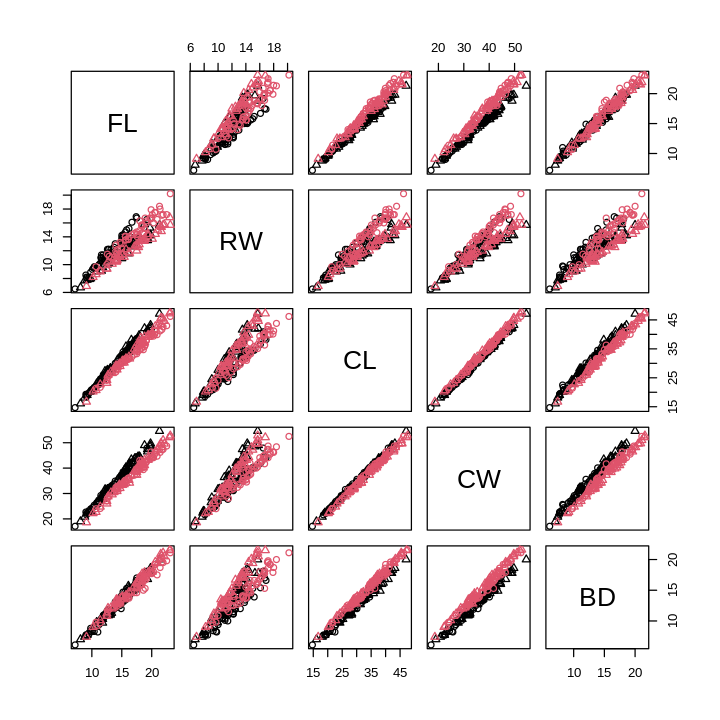

In [135]:
data(crabs)
summary(crabs)
plot(crabs[,4:8],col=as.numeric(crabs[,1]),pch=as.numeric(crabs[,2]))

Podemos ver como la feature RW parece dividir mejor según género y las especies se pueden dividir mejor con una combinación entre CW y FL.

Para hacer el análisis decidí utilizar siete versiones distintas del dataset con distintas transformaciones:


1.   Datos Base
2.   Transformación logarítmica
3.   Transformación logarítmica + Escalado
4.   Transformación logarítmica + Escalado + PCA
5.   Transformación logarítmica + Escalado + PCA + Escalado
6.   Transformación logarítmica + PCA
7.   Transformación logarítmica + PCA + Escalado


In [136]:
crabs_data <- crabs[,4:8]
crabs_log <- log(crabs_data)
crabs_log_scaled <- scale(crabs_log)
crabs_log_scaled_pca <- prcomp(crabs_log_scaled)
crabs_log_scaled_pca_scaled <- scale(crabs_log_scaled_pca$x)
crabs_log_pca <- prcomp(crabs_log)
crabs_log_pca_scaled <- scale(crabs_log_pca$x)

### K-Means

In [137]:
kmeans_crabs <- kmeans(crabs_data, centers=2, nstart = 20)
kmeans_crabs_log <- kmeans(crabs_log, centers=2, nstart = 20)
kmeans_crabs_log_scaled <- kmeans(crabs_log_scaled, centers=2, nstart = 20)
kmeans_crabs_log_scaled_pca <- kmeans(crabs_log_scaled_pca$x, centers=2, nstart = 20)
kmeans_crabs_log_scaled_pca_scaled <- kmeans(crabs_log_scaled_pca_scaled, centers=2, nstart = 20)
kmeans_crabs_log_pca <- kmeans(crabs_log_pca$x, centers=2, nstart = 20)
kmeans_crabs_log_pca_scaled <- kmeans(crabs_log_pca_scaled, centers=2, nstart = 20)

#### Especie

In [138]:
cat("------- Datos Base -------\n")
compare_clusters(crabs[,1], kmeans_crabs$cluster)
cat("\n\n------- Transformacion Logaritmica -------\n")
compare_clusters(crabs[,1], kmeans_crabs_log$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado -------\n")
compare_clusters(crabs[,1], kmeans_crabs_log_scaled$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA -------\n")
compare_clusters(crabs[,1], kmeans_crabs_log_scaled_pca$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,1], kmeans_crabs_log_scaled_pca_scaled$cluster)
cat("\n\n------- Transformacion Logaritmica + PCA -------\n")
compare_clusters(crabs[,1], kmeans_crabs_log_pca$cluster)
cat("\n\n------- Transformacion Logaritmica + PCA + Escalado -------\n")
compare_clusters(crabs[,1], kmeans_crabs_log_pca_scaled$cluster)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 59 %
     cluster_result
class  2  1
    B 61 39
    O 43 57


------- Transformacion Logaritmica -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 60.5 %
     cluster_result
class  1  2
    B 48 52
    O 27 73


------- Transformacion Logaritmica + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 60.5 %
     cluster_result
class  1  2
    B 48 52
    O 27 73


------- Transformacion Logaritmica + Escalado + PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 60.5 %
     cluster_result
class  1  2
    B 48 52
    O 27 73


------- Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 100 %
     cluster_result
class   1   2
    B 100   

##### Análisis

Podemos ver que utilizando una transformación logarítmica, luego la PCA y luego un escalado de los datos se pudo clusterizar las especies con un 100% de efectividad.

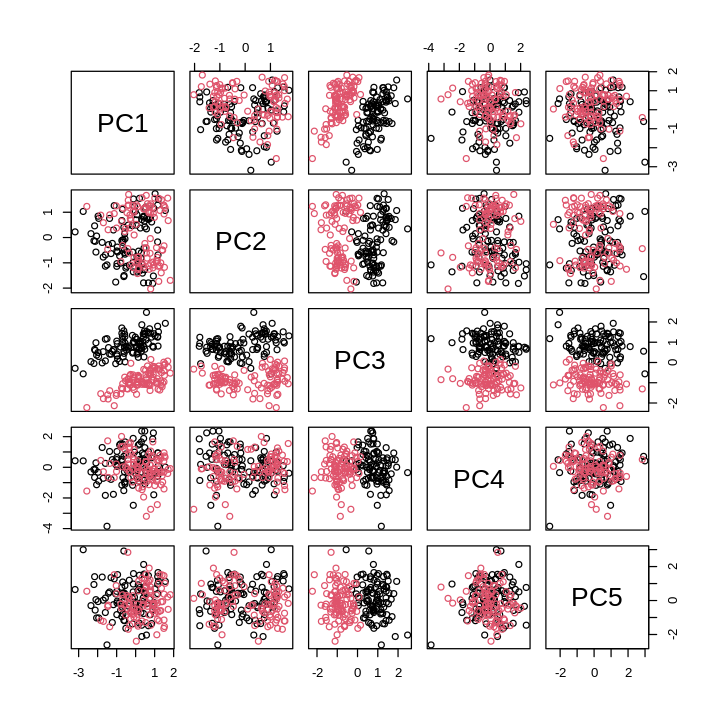

In [139]:
pairs(crabs_log_pca_scaled, col=as.numeric(crabs[,1]))

Podemos ver que claramete con la tercera dimensión de la PCA se forman dos divisiones muy marcadas de las especies y estos grupos son los encontrados por kmeans.

#### Género

In [140]:
cat("------- Datos Base -------\n")
compare_clusters(crabs[,2], kmeans_crabs$cluster)
cat("\n\n------- Transformacion Logaritmica -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_scaled$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_scaled_pca$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_scaled_pca_scaled$cluster)
cat("\n\n------- Transformacion Logaritmica + PCA -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_pca$cluster)
cat("\n\n------- Transformacion Logaritmica + PCA + Escalado -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_pca_scaled$cluster)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51 %
     cluster_result
class  2  1
    F 53 47
    M 51 49


------- Transformacion Logaritmica -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.5 %
     cluster_result
class  2  1
    F 64 36
    M 61 39


------- Transformacion Logaritmica + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.5 %
     cluster_result
class  2  1
    F 64 36
    M 61 39


------- Transformacion Logaritmica + Escalado + PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.5 %
     cluster_result
class  2  1
    F 64 36
    M 61 39


------- Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 50 %
     cl

##### Análisis
Podemos ver que los resultados en los géneros fueron bastante malos, lo cual tiene sentido, ya que al encontrar bien las especies no puede encontrar los generos con los mismos 2 clusters.

Para indagar mas en el tema decidí mirar los datos de la PCA con los colores según el género.

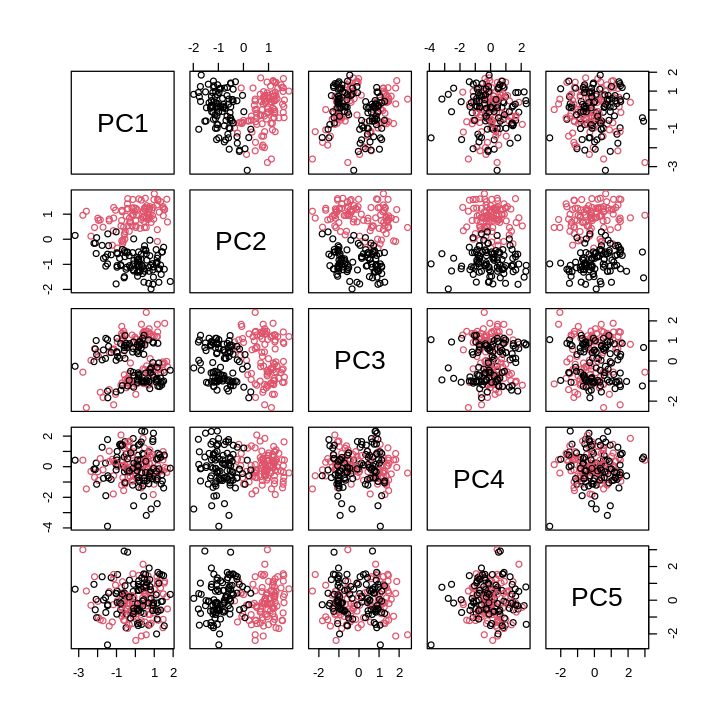

In [141]:
pairs(crabs_log_scaled_pca_scaled,col=as.numeric(crabs[,2]))

Claramente la segunda dimension de la PCA es la que mejor logra separar por género, por lo que decidí probar KMeans sobre la segunda dimensión y combinaciones de a 2 dimensiones que contengan la segunda.

In [142]:
crabs_log_scaled_pca_scaled_2 <- crabs_log_scaled_pca_scaled[, c(2)]
kmeans_crabs_log_scaled_pca_scaled_2 <- kmeans(crabs_log_scaled_pca_scaled_2, centers=2, nstart = 20)

crabs_log_scaled_pca_scaled_12 <- crabs_log_scaled_pca_scaled[, c(1, 2)]
kmeans_crabs_log_scaled_pca_scaled_12 <- kmeans(crabs_log_scaled_pca_scaled_12, centers=2, nstart = 20)

crabs_log_scaled_pca_scaled_23 <- crabs_log_scaled_pca_scaled[, c(2, 3)]
kmeans_crabs_log_scaled_pca_scaled_23 <- kmeans(crabs_log_scaled_pca_scaled_23, centers=2, nstart = 20)

crabs_log_scaled_pca_scaled_24 <- crabs_log_scaled_pca_scaled[, c(2, 4)]
kmeans_crabs_log_scaled_pca_scaled_24 <- kmeans(crabs_log_scaled_pca_scaled_24, centers=2, nstart = 20)

crabs_log_scaled_pca_scaled_25 <- crabs_log_scaled_pca_scaled[, c(2, 5)]
kmeans_crabs_log_scaled_pca_scaled_25 <- kmeans(crabs_log_scaled_pca_scaled_25, centers=2, nstart = 20)

In [143]:
cat("\n\n------- Variables PCA = {2} con Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_scaled_pca_scaled_2$cluster)

cat("\n\n------- Variables PCA = {1, 2} con Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_scaled_pca_scaled_12$cluster)

cat("\n\n------- Variables PCA = {2, 3} con Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_scaled_pca_scaled_23$cluster)

cat("\n\n------- Variables PCA = {2, 4} con Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_scaled_pca_scaled_24$cluster)

cat("\n\n------- Variables PCA = {2, 5} con Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,2], kmeans_crabs_log_scaled_pca_scaled_25$cluster)




------- Variables PCA = {2} con Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 94 %
     cluster_result
class  2  1
    F 96  4
    M  8 92


------- Variables PCA = {1, 2} con Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 94 %
     cluster_result
class  1  2
    F 96  4
    M  8 92


------- Variables PCA = {2, 3} con Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 94 %
     cluster_result
class  2  1
    F 96  4
    M  8 92


------- Variables PCA = {2, 4} con Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 94 %
     cluster_result
class  2  1
    F 96  4
    M  8 92


------- Variables PCA = {2, 5} con Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 2 of 2 pairs
Cases in

Podemos ver que en todos los clusters utilizando la PCA se logro obetener clusters que agrupaban según géneros por encima del 90%, en particular utilizando la segunda y la quinta dimension logramos obtener agrupaciones que coinciden en un 94.5% con los géneros.

### Hclust

Vamos a hacer un analisis de clusters jerárquicos utilizando average linkage y complete linkage.

In [144]:
hclust_crabs_average <- hclust(dist(crabs_data), method="average")
hclust_crabs_log_average <- hclust(dist(crabs_log), method="average")
hclust_crabs_log_scaled_average <- hclust(dist(crabs_log_scaled), method="average")
hclust_crabs_log_scaled_pca_average <- hclust(dist(crabs_log_scaled_pca$x), method="average")
hclust_crabs_log_scaled_pca_scaled_average <- hclust(dist(crabs_log_scaled_pca_scaled), method="average")
hclust_crabs_log_pca_average <- hclust(dist(crabs_log_pca$x), method="average")
hclust_crabs_log_pca_scaled_average <- hclust(dist(crabs_log_pca_scaled), method="average")

In [145]:
hclust_crabs_complete <- hclust(dist(crabs_data), method="complete")
hclust_crabs_log_complete <- hclust(dist(crabs_log), method="complete")
hclust_crabs_log_scaled_complete <- hclust(dist(crabs_log_scaled), method="complete")
hclust_crabs_log_scaled_pca_complete <- hclust(dist(crabs_log_scaled_pca$x), method="complete")
hclust_crabs_log_scaled_pca_scaled_complete <- hclust(dist(crabs_log_scaled_pca_scaled), method="complete")
hclust_crabs_log_pca_complete <- hclust(dist(crabs_log_pca$x), method="complete")
hclust_crabs_log_pca_scaled_complete <- hclust(dist(crabs_log_pca_scaled), method="complete")

#### Average

##### Gráficas hclust

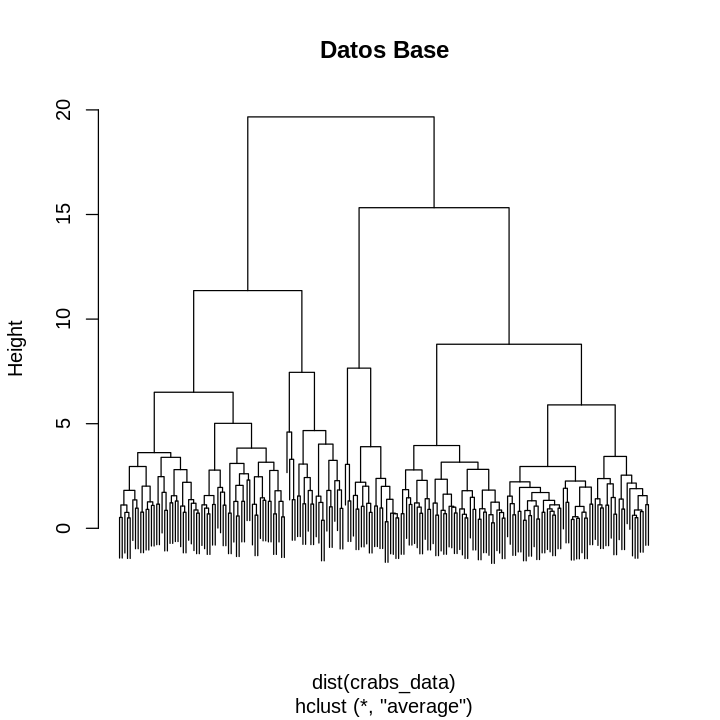

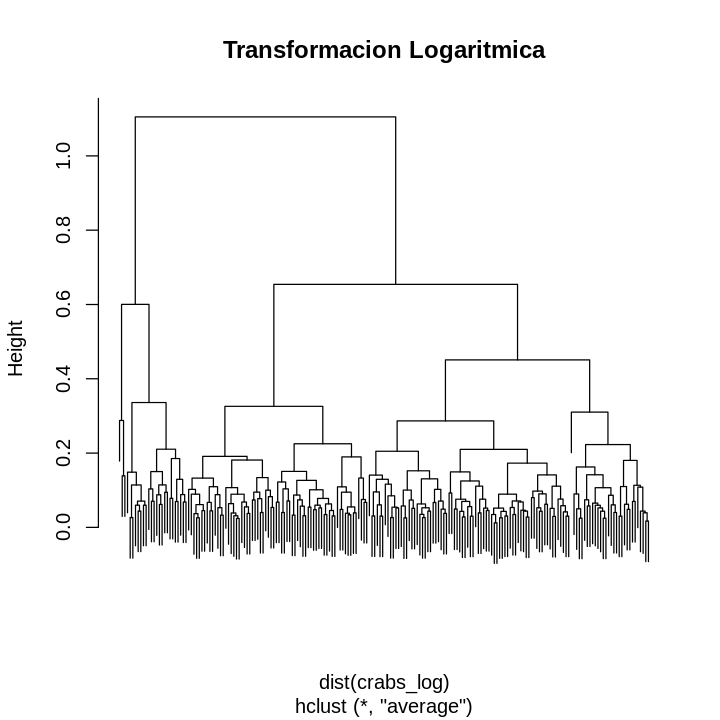

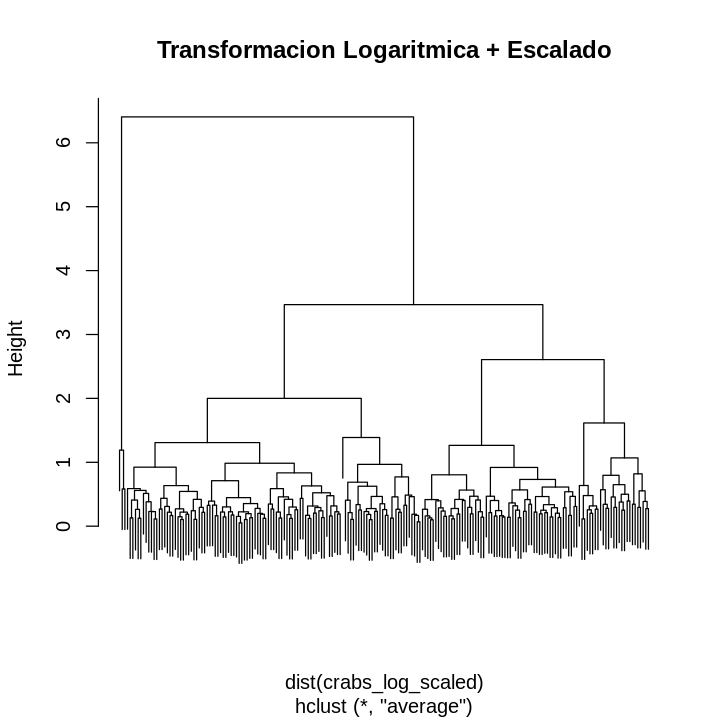

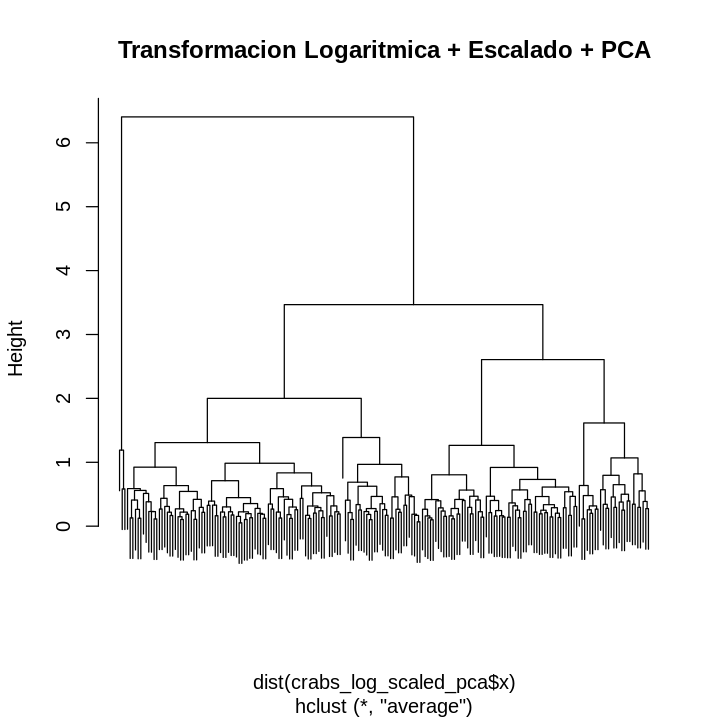

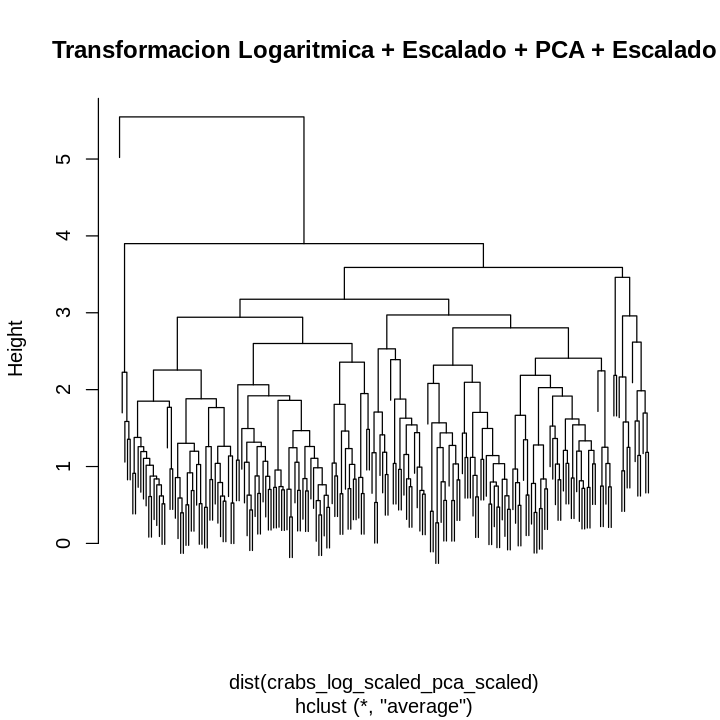

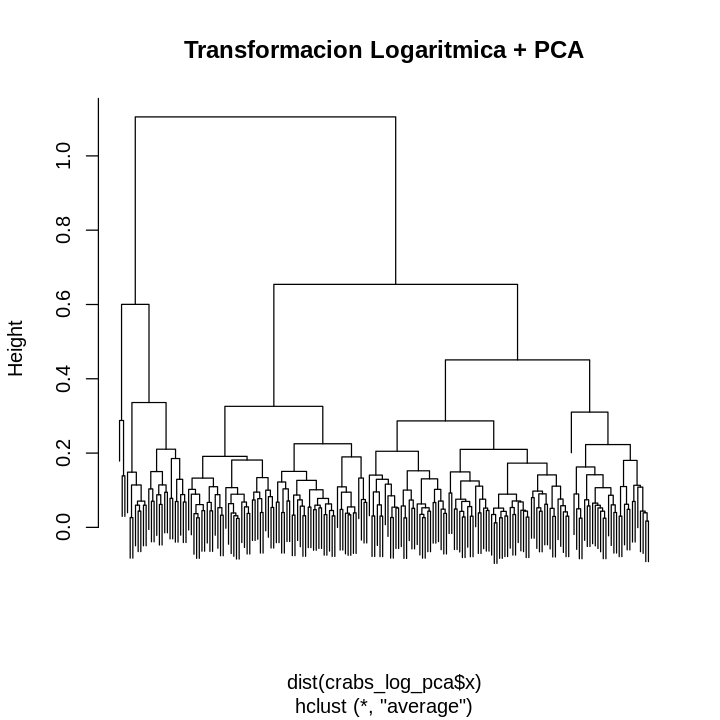

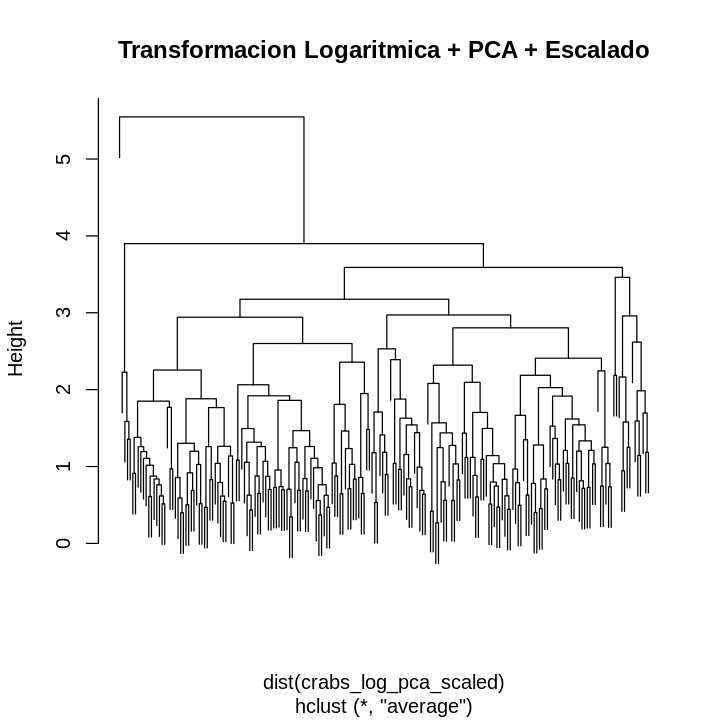

In [146]:
plot(hclust_crabs_average, main="Datos Base", labels = FALSE)

plot(hclust_crabs_log_average, main="Transformacion Logaritmica", labels = FALSE)

plot(hclust_crabs_log_scaled_average, main="Transformacion Logaritmica + Escalado", labels = FALSE)

plot(hclust_crabs_log_scaled_pca_average, main="Transformacion Logaritmica + Escalado + PCA", labels = FALSE)

plot(hclust_crabs_log_scaled_pca_scaled_average, main="Transformacion Logaritmica + Escalado + PCA + Escalado", labels = FALSE)

plot(hclust_crabs_log_pca_average, main="Transformacion Logaritmica + PCA", labels = FALSE)

plot(hclust_crabs_log_pca_scaled_average, main="Transformacion Logaritmica + PCA + Escalado", labels = FALSE)

Mirando todas las gráficas de average linkage podemos ver que en muchos casos se generaron dos grupos principales, pero en casi todos los datasets si cortamos el árbol en dos clusters siempre nos va a quedar un grupo con outliers y otro con casi todos los puntos. El único caso donde se obtuvieron 2 clases con aproximadamente la mitad de los datos cada una es con los datos base.

Este problema se debe a que hay outliers que no se categorizan como en los clusters principales, generando ramas muy arriba en las jerarquias.

##### Análisis de clusters

Cortamos los árboles en dos ya que son las cantidad de clases que tenemos por especie y por género.

In [147]:
hclust_crabs_average_cutted <- cutree(hclust_crabs_average, k = 2)
hclust_crabs_log_average_cutted <- cutree(hclust_crabs_log_average, k = 2)
hclust_crabs_log_scaled_average_cutted <- cutree(hclust_crabs_log_scaled_average, k = 2)
hclust_crabs_log_scaled_pca_average_cutted <- cutree(hclust_crabs_log_scaled_pca_average, k = 2)
hclust_crabs_log_scaled_pca_scaled_average_cutted <- cutree(hclust_crabs_log_scaled_pca_scaled_average, k = 2)
hclust_crabs_log_pca_average_cutted <- cutree(hclust_crabs_log_pca_average, k = 2)
hclust_crabs_log_pca_scaled_average_cutted <- cutree(hclust_crabs_log_pca_scaled_average, k = 2)

###### Especie

In [148]:
cat("------- Datos Base -------\n")
compare_clusters(crabs[,1], hclust_crabs_average_cutted)
cat("\n\n------- Transformacion Logaritmica -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_average_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_scaled_average_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_scaled_pca_average_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_scaled_pca_scaled_average_cutted)
cat("\n\n------- Transformacion Logaritmica + PCA -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_pca_average_cutted)
cat("\n\n------- Transformacion Logaritmica + PCA + Escalado -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_pca_scaled_average_cutted)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 61.5 %
     cluster_result
class  1  2
    B 69 31
    O 46 54


------- Transformacion Logaritmica -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 57 %
     cluster_result
class  1  2
    B 20 80
    O  6 94


------- Transformacion Logaritmica + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 50.5 %
     cluster_result
class  1  2
    B  2 98
    O  1 99


------- Transformacion Logaritmica + Escalado + PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 50.5 %
     cluster_result
class  1  2
    B  2 98
    O  1 99


------- Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 50.5 %
     

Podemos ver que el mejor resultado lo obtuvimos con los datos sin modificaciones como ya era esperable, obteniendo un 61.5% de coincidencia con las especies. Se puede ver como en los gráficos que la primera division va a algún outlier el match es de 50% como es esperable.

###### Género

In [149]:
cat("------- Datos Base -------\n")
compare_clusters(crabs[,2], hclust_crabs_average_cutted)
cat("\n\n------- Transformacion Logaritmica -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_average_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_scaled_average_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_scaled_pca_average_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_scaled_pca_scaled_average_cutted)
cat("\n\n------- Transformacion Logaritmica + PCA -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_pca_average_cutted)
cat("\n\n------- Transformacion Logaritmica + PCA + Escalado -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_pca_scaled_average_cutted)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 55.5 %
     cluster_result
class  1  2
    F 63 37
    M 52 48


------- Transformacion Logaritmica -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51 %
     cluster_result
class  1  2
    F 14 86
    M 12 88


------- Transformacion Logaritmica + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 50.5 %
     cluster_result
class  2  1
    F 99  1
    M 98  2


------- Transformacion Logaritmica + Escalado + PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 50.5 %
     cluster_result
class  2  1
    F 99  1
    M 98  2


------- Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 50.5 %
     

Los resultados obtenidos con género son peores que los obtenido con especie, obteniendo 55.5% como mejor match con los datos base.

#### Complete

##### Gráficas hclust

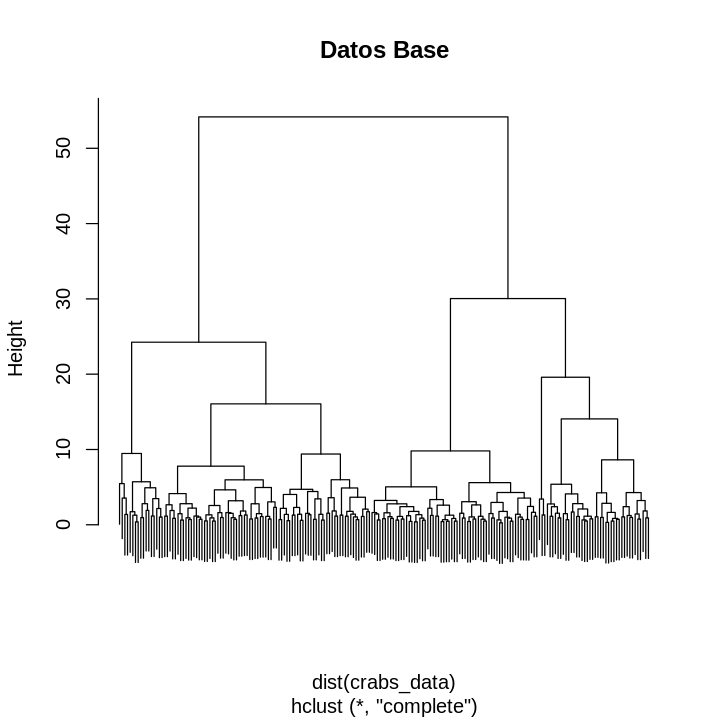

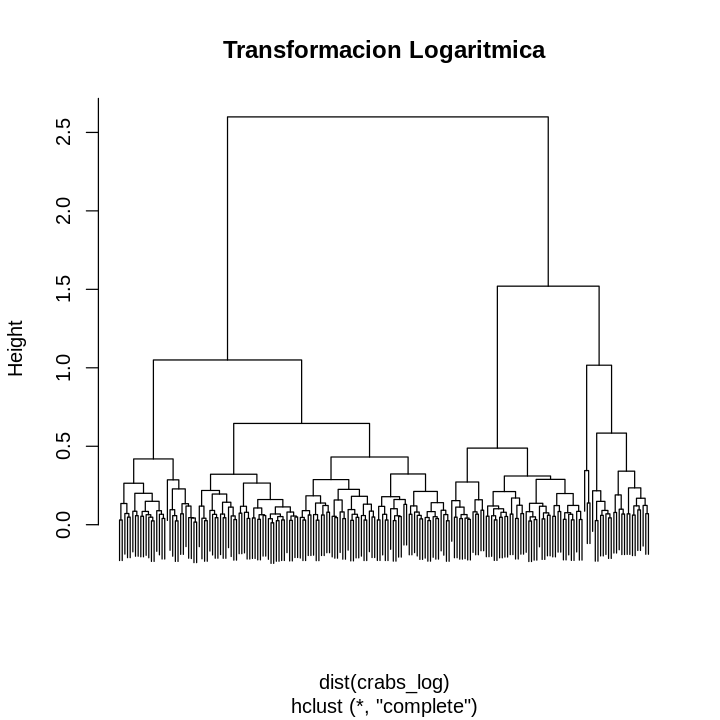

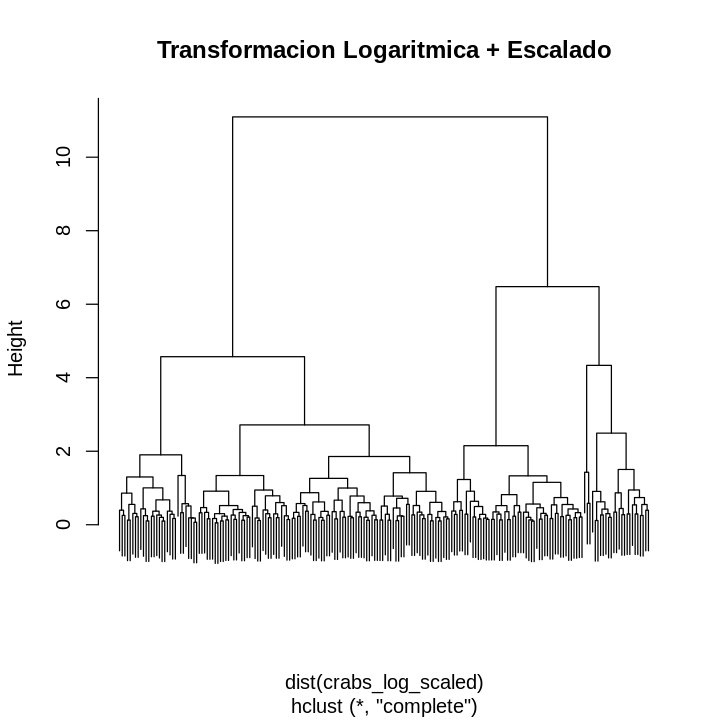

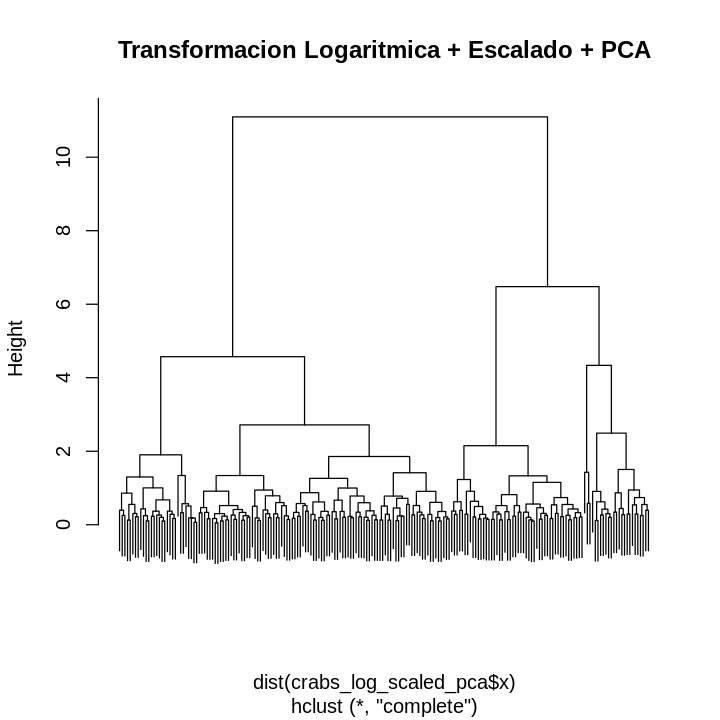

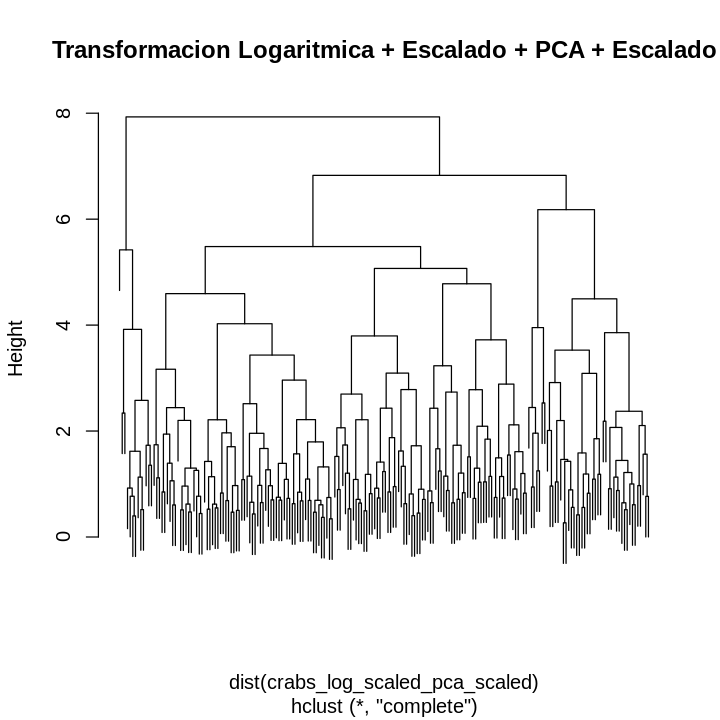

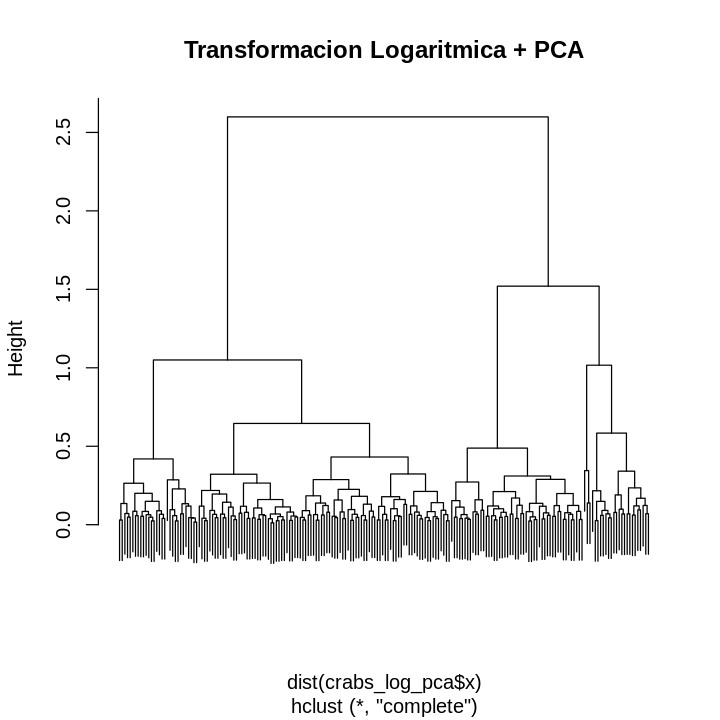

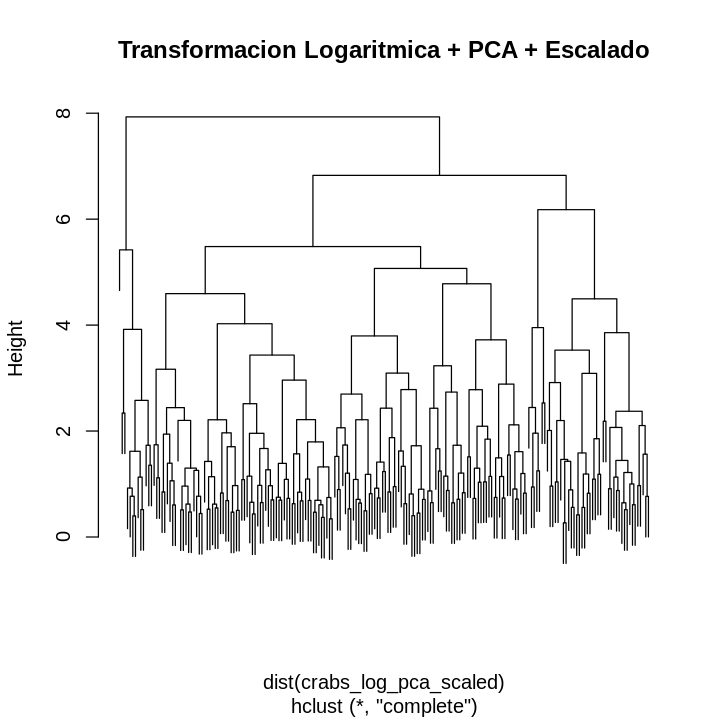

In [150]:
plot(hclust_crabs_complete, main="Datos Base", labels = FALSE)

plot(hclust_crabs_log_complete, main="Transformacion Logaritmica", labels = FALSE)

plot(hclust_crabs_log_scaled_complete, main="Transformacion Logaritmica + Escalado", labels = FALSE)

plot(hclust_crabs_log_scaled_pca_complete, main="Transformacion Logaritmica + Escalado + PCA", labels = FALSE)

plot(hclust_crabs_log_scaled_pca_scaled_complete, main="Transformacion Logaritmica + Escalado + PCA + Escalado", labels = FALSE)

plot(hclust_crabs_log_pca_complete, main="Transformacion Logaritmica + PCA", labels = FALSE)

plot(hclust_crabs_log_pca_scaled_complete, main="Transformacion Logaritmica + PCA + Escalado", labels = FALSE)

Con complete linkeage podemos ver que se obtuvieron en mas casos 2 ramas principales mas balanceadas. Donde no sucedió esto fue en los datasets donde hicimos PCA + Escalado. Veamos si esto se reflejó en una mayor coincidencia con respecto a los clusters conocidos.

##### Análisis de clusters

In [151]:
hclust_crabs_complete_cutted <- cutree(hclust_crabs_complete, k = 2)
hclust_crabs_log_complete_cutted <- cutree(hclust_crabs_log_complete, k = 2)
hclust_crabs_log_scaled_complete_cutted <- cutree(hclust_crabs_log_scaled_complete, k = 2)
hclust_crabs_log_scaled_pca_complete_cutted <- cutree(hclust_crabs_log_scaled_pca_complete, k = 2)
hclust_crabs_log_scaled_pca_scaled_complete_cutted <- cutree(hclust_crabs_log_scaled_pca_scaled_complete, k = 2)
hclust_crabs_log_pca_complete_cutted <- cutree(hclust_crabs_log_pca_complete, k = 2)
hclust_crabs_log_pca_scaled_complete_cutted <- cutree(hclust_crabs_log_pca_scaled_complete, k = 2)

###### Especie

In [152]:
cat("------- Datos Base -------\n")
compare_clusters(crabs[,1], hclust_crabs_complete_cutted)
cat("\n\n------- Transformacion Logaritmica -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_scaled_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_scaled_pca_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_scaled_pca_scaled_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + PCA -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_pca_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + PCA + Escalado -------\n")
compare_clusters(crabs[,1], hclust_crabs_log_pca_scaled_complete_cutted)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 59.5 %
     cluster_result
class  1  2
    B 62 38
    O 43 57


------- Transformacion Logaritmica -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 60.5 %
     cluster_result
class  1  2
    B 48 52
    O 27 73


------- Transformacion Logaritmica + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 60.5 %
     cluster_result
class  1  2
    B 48 52
    O 27 73


------- Transformacion Logaritmica + Escalado + PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 60.5 %
     cluster_result
class  1  2
    B 48 52
    O 27 73


------- Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 53.5 %
   

Podemos ver que logramos obtener un 60% de coincidencia con las especies en varios de los conjuntos de datos, pero ninguno logró alcanzar al mejor obtenido con avergage linkage.

###### Género

In [153]:
cat("------- Datos Base -------\n")
compare_clusters(crabs[,2], hclust_crabs_complete_cutted)
cat("\n\n------- Transformacion Logaritmica -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_scaled_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_scaled_pca_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_scaled_pca_scaled_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + PCA -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_pca_complete_cutted)
cat("\n\n------- Transformacion Logaritmica + PCA + Escalado -------\n")
compare_clusters(crabs[,2], hclust_crabs_log_pca_scaled_complete_cutted)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 50.5 %
     cluster_result
class  1  2
    F 53 47
    M 52 48


------- Transformacion Logaritmica -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.5 %
     cluster_result
class  2  1
    F 64 36
    M 61 39


------- Transformacion Logaritmica + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.5 %
     cluster_result
class  2  1
    F 64 36
    M 61 39


------- Transformacion Logaritmica + Escalado + PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.5 %
     cluster_result
class  2  1
    F 64 36
    M 61 39


------- Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 56.5 %
   

Logramos obtener un 56.5% de coincidencia con los géneros, pero analizando las clases podemos ver que todos los cangrejos machos fueron categorizados como la misma clase y casi todos los hembra tambien. Tambien me parece importante destacar que los dos datasets que obtuvieron 56.5% son los que no tienen dos grupos marcados en las gráficas y fueron afectados por outliers.  

#### Análisis
En general podemos ver como los métodos jerárquicos son inferiores a KMeans, pero esto se debe a que los outliers generan ramas muy arriba en el árbol, haciendo que al cortar en solo 2 clases no podamos obtener las dos clases principales que muchas veces se pueden observar. Probablemente hay algún análisis mejor que se pueda hacer de estos métodos y que sea mas justo, no me parece que alcance con comparar solo 2 cortes de los árboles.

Con respecto a la comparación entre complete y average, no puedo decantarme por niguno de los dos ya que no tengo métodos para compararlos de manera justa. Pero en un principio parece que complete tiende a hacer mas jerarquias balanceadas meintras que average es mas sensible a outliers muy alejados.

## Apartado B

### Carga del dataset y análisis PCA

In [154]:
load("/content/lampone.Rdata")
years <- lampone[,1]
especie <- lampone[,143]
#summary(lampone)
# Elimino la primera que es año, la 143 que es la especie y la 144 porque es categorica
lampone <- lampone[, -c(1, 143, 144)]
# El dataset tiene columnas con 0 varianza por lo que decidi eliminarlas
zero_var_cols <- sapply(lampone, function(x) sd(x, na.rm = TRUE) == 0)
lampone <- lampone[, !zero_var_cols]

Para el análisis de este dataset no pude utilizar una trasnformacion logaritmica ya que me daba errores al momento de hacer la PCA, por lo que decidi utilizar los siguientes seis datasets:


1.   Datos base
2.   Escalado
3.   Escalado + PCA
4.   Escalado + PCA + Escalado
5.   PCA
6.   PCA + Escalado



In [155]:
lampone_scaled <- scale(lampone)
lampone_scaled_pca <- prcomp(lampone_scaled)
lampone_scaled_pca_scaled <- scale(lampone_scaled_pca$x)
lampone_pca <- prcomp(lampone)
lampone_pca_scaled <- scale(lampone_pca$x)

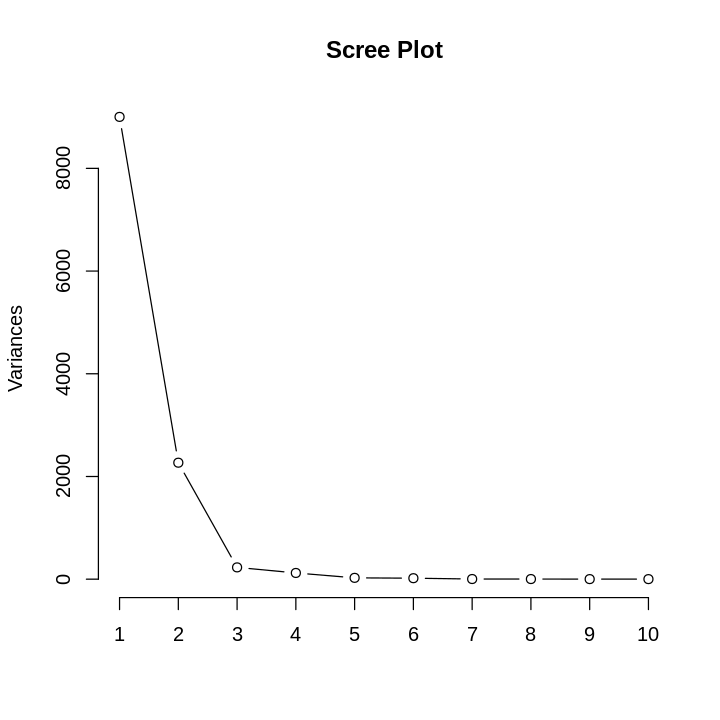

In [156]:
screeplot(lampone_pca, type = "lines", main = "Scree Plot")

Podemos ver que las primeras 3 dimensiones son las que mejor separan los datos, por lo que comparamos estas entre ellas.

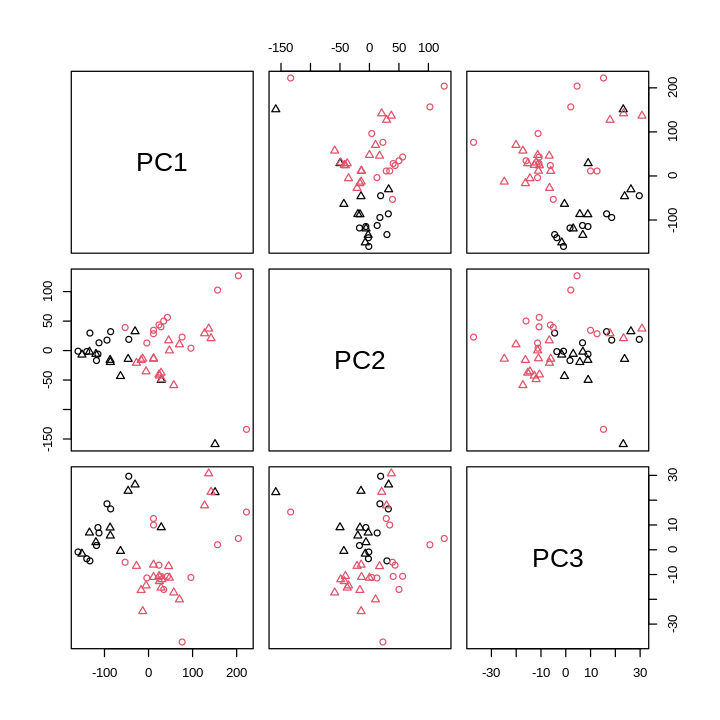

In [157]:
pairs(lampone_pca$x[,1:3],col=as.numeric(years), pch=as.numeric(especie))

Mirando las relaciones entre estas tres dimensiones podemos ver que por lo menos los años son separables, lo mismo no se puede apreciar facilmente con la especie, pero la segunda parece ser la mas importante.

### K-Means

In [158]:
kmeans_lampone <- kmeans(lampone, centers=2, nstart = 20)
kmeans_lampone_scaled <- kmeans(lampone_scaled, centers=2, nstart = 20)
kmeans_lampone_scaled_pca <- kmeans(lampone_scaled_pca$x, centers=2, nstart = 20)
kmeans_lampone_scaled_pca_scaled <- kmeans(lampone_scaled_pca_scaled, centers=2, nstart = 20)
kmeans_lampone_pca <- kmeans(lampone_pca$x, centers=2, nstart = 20)
kmeans_lampone_pca_scaled <- kmeans(lampone_pca_scaled, centers=2, nstart = 20)

#### Años

In [159]:
cat("------- Datos Base -------\n")
compare_clusters(years, kmeans_lampone$cluster)
cat("\n\n------- Escalado -------\n")
compare_clusters(years, kmeans_lampone_scaled$cluster)
cat("\n\n------- Escalado + PCA -------\n")
compare_clusters(years, kmeans_lampone_scaled_pca$cluster)
cat("\n\n------- Escalado + PCA + Escalado -------\n")
compare_clusters(years, kmeans_lampone_scaled_pca_scaled$cluster)
cat("\n\n------- PCA -------\n")
compare_clusters(years, kmeans_lampone_pca$cluster)
cat("\n\n------- PCA + Escalado -------\n")
compare_clusters(years, kmeans_lampone_pca_scaled$cluster)

------- Datos Base -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 91.84 %
      cluster_result
class   1  2
  2006 17  2
  2007  2 28


------- Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 97.96 %
      cluster_result
class   2  1
  2006 19  0
  2007  1 29


------- Escalado + PCA -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 97.96 %
      cluster_result
class   2  1
  2006 19  0
  2007  1 29


------- Escalado + PCA + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 59.18 %
      cluster_result
class   2  1
  2006  9 10
  2007 10 20


------- PCA -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 91.84 %
      cluster_result
class   2  1
  2006 17  2
  2007  2 28


------- PCA + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 61.22 %
      cluster_result
class   2  1
  2006 13  6
  2007 13

Podemos ver que los diferentes años pudieron ser clusterizados correctamente, llegando a tener un 97.96% de coincidencia lo que significa que solo 1 punto terminó en un cluster equivocado.

Este resultado se logró utilizando los datos escalados y la pca de los datos escalados.

#### Especie

In [160]:
cat("------- Datos Base -------\n")
compare_clusters(especie, kmeans_lampone$cluster)
cat("\n\n------- Escalado -------\n")
compare_clusters(especie, kmeans_lampone_scaled$cluster)
cat("\n\n------- Escalado + PCA -------\n")
compare_clusters(especie, kmeans_lampone_scaled_pca$cluster)
cat("\n\n------- Escalado + PCA + Escalado -------\n")
compare_clusters(especie, kmeans_lampone_scaled_pca_scaled$cluster)
cat("\n\n-------  PCA -------\n")
compare_clusters(especie, kmeans_lampone_pca$cluster)
cat("\n\n------- PCA + Escalado -------\n")
compare_clusters(especie, kmeans_lampone_pca_scaled$cluster)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 57.14 %
     cluster_result
class  1  2
   2  10 12
   10  9 18


------- Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 55.1 %
     cluster_result
class  2  1
   2  10 12
   10 10 17


------- Escalado + PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 55.1 %
     cluster_result
class  2  1
   2  10 12
   10 10 17


------- Escalado + PCA + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.02 %
     cluster_result
class  1  2
   2  14  8
   10 16 11


-------  PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 57.14 %
     cluster_result
class  2  1
   2  10 12
   10  9 18


------- PCA + Escalado -------
Direct agreement: 0 

Podemos ver que no se tuvo un buen resultado, por lo que decido analizar las pricipales variables de la PCA + Escalado ya que fue donde mejores resultados obtuvimos.

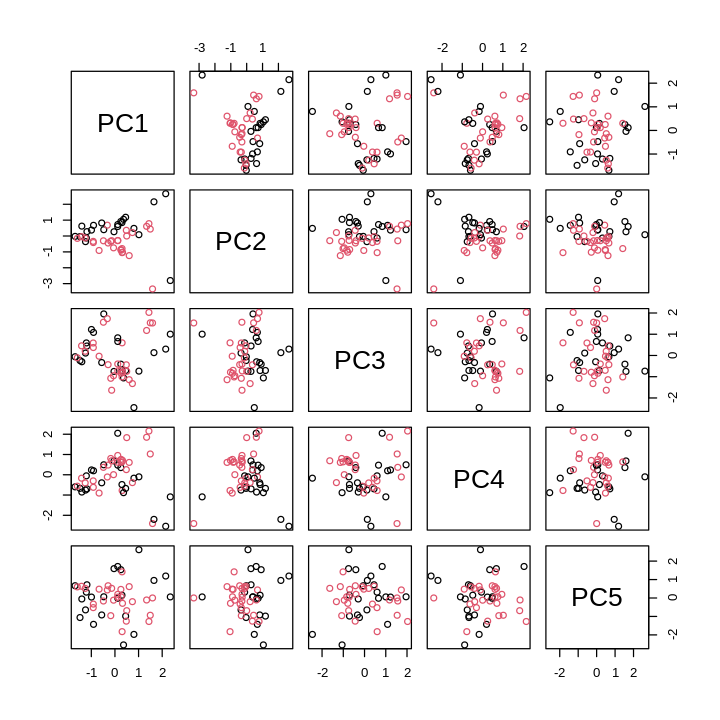

In [161]:
pairs(lampone_pca_scaled[,1:5],col=as.numeric(especie))

Podemos ver que la segunda es la mas importante, por lo que intento crear los clusters con esta y con la pca sin escalar ya que son las mismas dimensiones.

In [162]:
kmeans_lampone_pca_2 <- kmeans(lampone_pca$x[, 2], centers=2, nstart = 20)
kmeans_lampone_pca_scaled_2 <- kmeans(lampone_pca_scaled[,2], centers=2, nstart = 20)

kmeans_lampone_pca_12 <- kmeans(lampone_pca$x[, c(1,2)], centers=2, nstart = 20)
kmeans_lampone_pca_scaled_12 <- kmeans(lampone_pca_scaled[,c(1,2)], centers=2, nstart = 20)

kmeans_lampone_pca_23 <- kmeans(lampone_pca$x[, c(2,3)], centers=2, nstart = 20)
kmeans_lampone_pca_scaled_23 <- kmeans(lampone_pca_scaled[,c(2,3)], centers=2, nstart = 20)

kmeans_lampone_pca_24 <- kmeans(lampone_pca$x[, c(2,4)], centers=2, nstart = 20)
kmeans_lampone_pca_scaled_24 <- kmeans(lampone_pca_scaled[,c(2,4)], centers=2, nstart = 20)

kmeans_lampone_pca_25 <- kmeans(lampone_pca$x[, c(2,5)], centers=2, nstart = 20)
kmeans_lampone_pca_scaled_25 <- kmeans(lampone_pca_scaled[,c(2,5)], centers=2, nstart = 20)

In [163]:
cat("\n\n------- Variables {2} con PCA -------\n")
compare_clusters(especie, kmeans_lampone_pca_2$cluster)
cat("\n\n------- Variables {2} con PCA + Escalado -------\n")
compare_clusters(especie, kmeans_lampone_pca_scaled_2$cluster)

cat("\n\n------- Variables {1, 2} con PCA -------\n")
compare_clusters(especie, kmeans_lampone_pca_12$cluster)
cat("\n\n------- Variables {1, 2} con PCA + Escalado -------\n")
compare_clusters(especie, kmeans_lampone_pca_scaled_12$cluster)

cat("\n\n------- Variables {2, 3} con PCA -------\n")
compare_clusters(especie, kmeans_lampone_pca_23$cluster)
cat("\n\n------- Variables {2, 3} con PCA + Escalado -------\n")
compare_clusters(especie, kmeans_lampone_pca_scaled_23$cluster)

cat("\n\n------- Variables {2, 4} con PCA -------\n")
compare_clusters(especie, kmeans_lampone_pca_24$cluster)
cat("\n\n------- Variables {2, 4} con PCA + Escalado -------\n")
compare_clusters(especie, kmeans_lampone_pca_scaled_24$cluster)

cat("\n\n------- Variables {2, 5} con PCA -------\n")
compare_clusters(especie, kmeans_lampone_pca_25$cluster)
cat("\n\n------- Variables {2, 5} con PCA + Escalado -------\n")
compare_clusters(especie, kmeans_lampone_pca_scaled_25$cluster)



------- Variables {2} con PCA -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 77.55 %
     cluster_result
class  2  1
   2  17  5
   10  6 21


------- Variables {2} con PCA + Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 77.55 %
     cluster_result
class  1  2
   2  17  5
   10  6 21


------- Variables {1, 2} con PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 53.06 %
     cluster_result
class  2  1
   2  10 12
   10 11 16


------- Variables {1, 2} con PCA + Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 63.27 %
     cluster_result
class  2  1
   2  10 12
   10  6 21


------- Variables {2, 3} con PCA -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 77.55 %
     cluster_result
class  2  1
   2  17  5
   10  6 21


------- Variables {2, 3} con PCA + Escalado -------
Direct agreement: 0 of 2 pairs
Iteration

El mejor resultado que logramos obtener fue 77.55% lo cual significa 11 puntos mal asignados. Esto se logró con varias combinaciones, pero en particular se logró mirando únicamente la variable 2 al momento de clusterizar, esto es evidencia de que esa dimensión de la PCA es la única importante al momento de sepárar por Especies.

### Hclust

Nuevamente hacemos clusters jerárquicos haciendo uso de average y complete linkage.

In [164]:
hclust_lampone_average <- hclust(dist(lampone), method="average")
hclust_lampone_scaled_average <- hclust(dist(lampone_scaled), method="average")
hclust_lampone_scaled_pca_average <- hclust(dist(lampone_scaled_pca$x), method="average")
hclust_lampone_scaled_pca_scaled_average <- hclust(dist(lampone_scaled_pca_scaled), method="average")
hclust_lampone_pca_average <- hclust(dist(lampone_pca$x), method="average")
hclust_lampone_pca_scaled_average <- hclust(dist(lampone_pca_scaled), method="average")

In [165]:
hclust_lampone_complete <- hclust(dist(lampone), method="complete")
hclust_lampone_scaled_complete <- hclust(dist(lampone_scaled), method="complete")
hclust_lampone_scaled_pca_complete <- hclust(dist(lampone_scaled_pca$x), method="complete")
hclust_lampone_scaled_pca_scaled_complete <- hclust(dist(lampone_scaled_pca_scaled), method="complete")
hclust_lampone_pca_complete <- hclust(dist(lampone_pca$x), method="complete")
hclust_lampone_pca_scaled_complete <- hclust(dist(lampone_pca_scaled), method="complete")

#### Average

##### Gráficas hclust

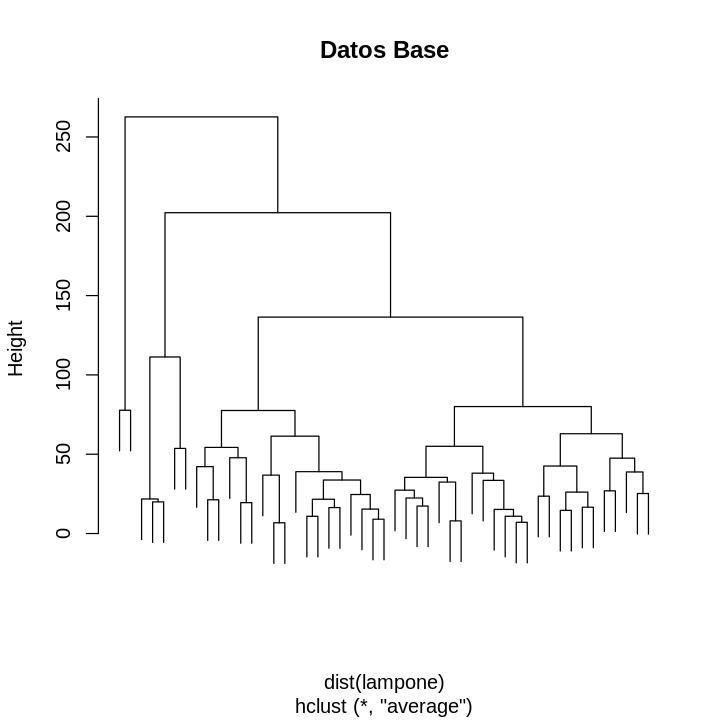

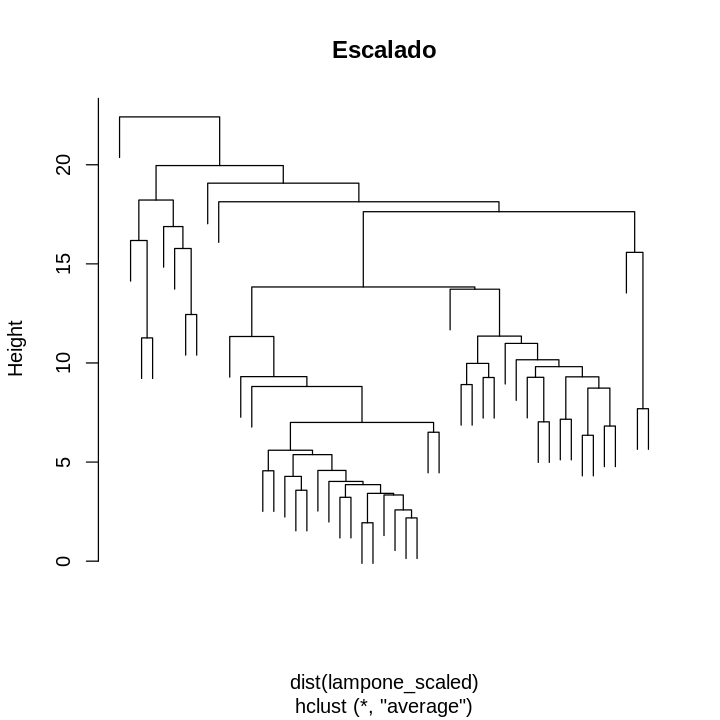

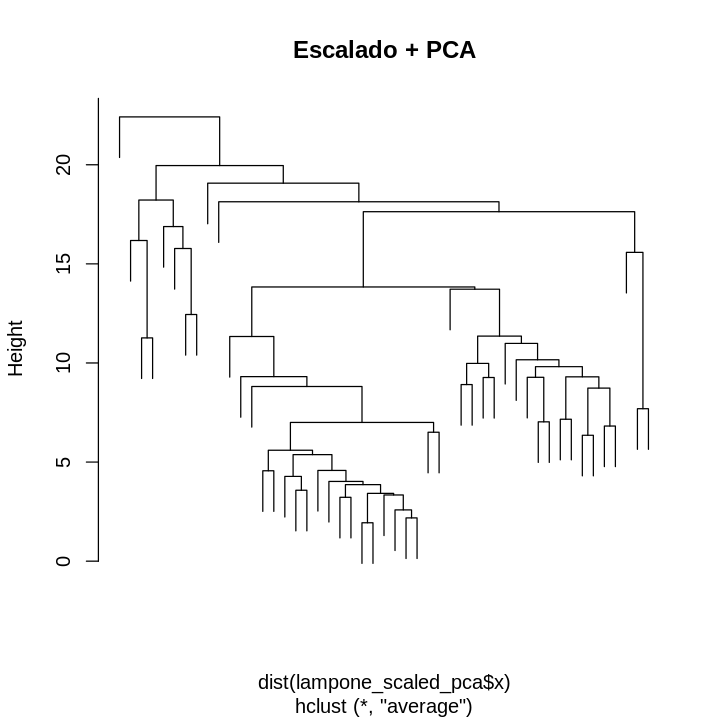

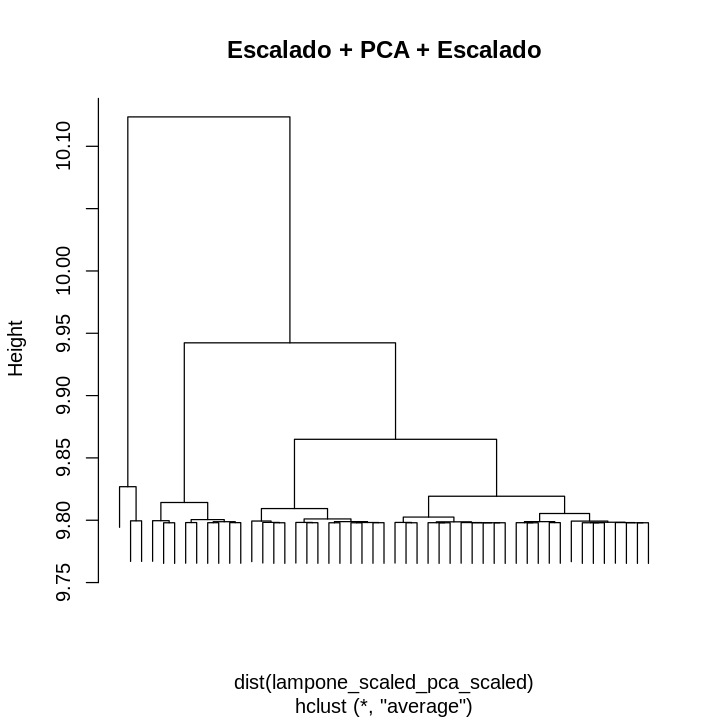

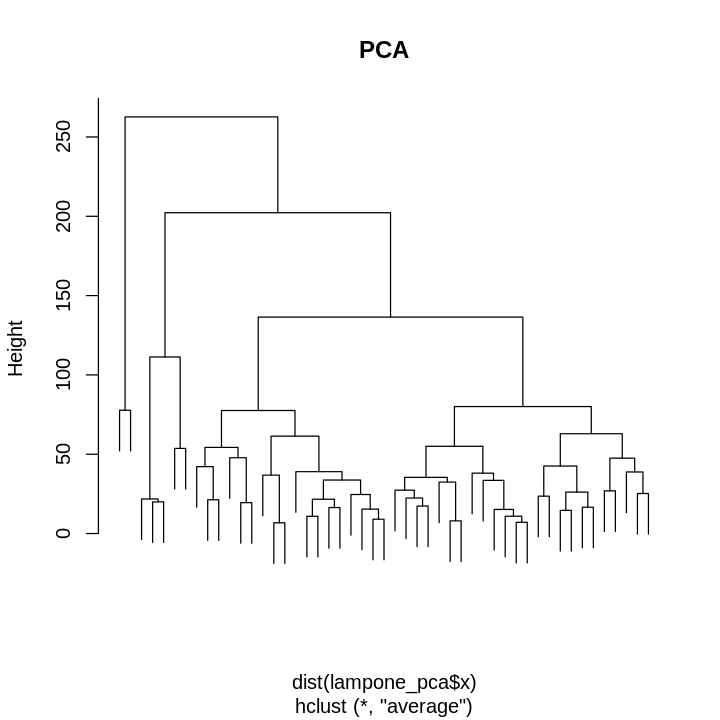

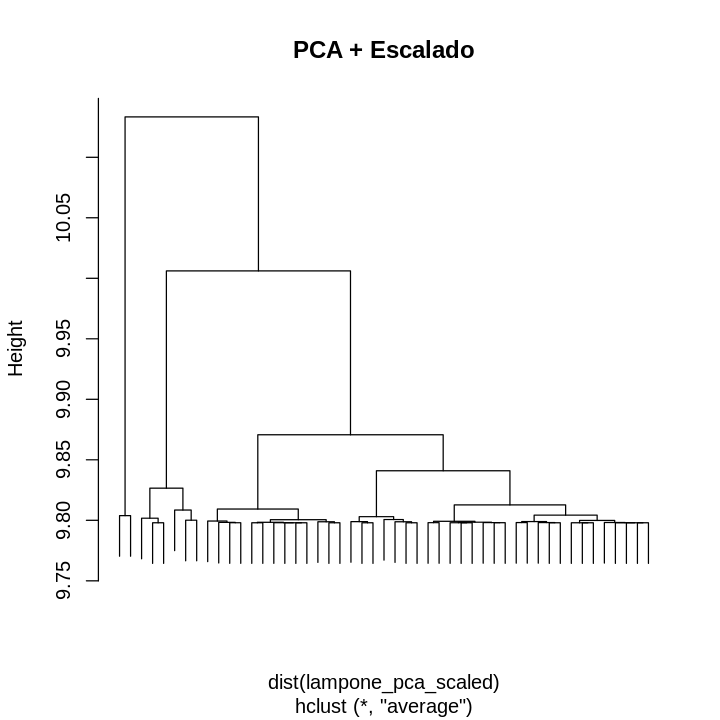

In [166]:
plot(hclust_lampone_average, main="Datos Base", labels = FALSE)

plot(hclust_lampone_scaled_average, main="Escalado", labels = FALSE)

plot(hclust_lampone_scaled_pca_average, main="Escalado + PCA", labels = FALSE)

plot(hclust_lampone_scaled_pca_scaled_average, main="Escalado + PCA + Escalado", labels = FALSE)

plot(hclust_lampone_pca_average, main="PCA", labels = FALSE)

plot(hclust_lampone_pca_scaled_average, main="PCA + Escalado", labels = FALSE)

Podemos apreciar que en solo utilizando los datos bases se lograron obtener dos grandes grupos pero los podriamos apreciar si cortamos en cuatro clusters, lo cual no nos sirve en nuestro problema.
Para el resto de conjuntos de datos no se generaron dos clusters principales.

Por todas estas razones estimo que los resultados al cortar estos árboles en 2 clusters no van a ser buenos.

##### Análisis de clusters

In [167]:
hclust_lampone_average_cutted <- cutree(hclust_lampone_average, k = 2)
hclust_lampone_scaled_average_cutted <- cutree(hclust_lampone_scaled_average, k = 2)
hclust_lampone_scaled_pca_average_cutted <- cutree(hclust_lampone_scaled_pca_average, k = 2)
hclust_lampone_scaled_pca_scaled_average_cutted <- cutree(hclust_lampone_scaled_pca_scaled_average, k = 2)
hclust_lampone_pca_average_cutted <- cutree(hclust_lampone_pca_average, k = 2)
hclust_lampone_pca_scaled_average_cutted <- cutree(hclust_lampone_pca_scaled_average, k = 2)

##### Años

In [168]:
cat("------- Datos Base -------\n")
compare_clusters(years, hclust_lampone_average_cutted)
cat("\n\n------- Escalado -------\n")
compare_clusters(years, hclust_lampone_scaled_average_cutted)
cat("\n\n------- Escalado + PCA -------\n")
compare_clusters(years, hclust_lampone_scaled_pca_average_cutted)
cat("\n\n------- Escalado + PCA + Escalado -------\n")
compare_clusters(years, hclust_lampone_scaled_pca_scaled_average_cutted)
cat("\n\n------- PCA -------\n")
compare_clusters(years, hclust_lampone_pca_average_cutted)
cat("\n\n------- PCA + Escalado -------\n")
compare_clusters(years, hclust_lampone_pca_scaled_average_cutted)

------- Datos Base -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 61.22 %
      cluster_result
class   2  1
  2006  1 18
  2007  1 29


------- Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 59.18 %
      cluster_result
class   2  1
  2006  0 19
  2007  1 29


------- Escalado + PCA -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 59.18 %
      cluster_result
class   2  1
  2006  0 19
  2007  1 29


------- Escalado + PCA + Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 59.18 %
      cluster_result
class   2  1
  2006  1 18
  2007  2 28


------- PCA -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 61.22 %
      cluster_result
class   2  1
  2006  1 18
  2007  1 29


------- PCA + Escalado -------

Lo mejor que pudimos obtener para el año es 65.31%, donde casi tenemos un error completo para una de las clase ya que uno de los dos clusters solo tiene dos puntos. Esto lo conseguimos con la PCA + Escalado.

##### Especies

In [169]:
cat("------- Datos Base -------\n")
compare_clusters(especie, hclust_lampone_average_cutted)
cat("\n\n------- Escalado -------\n")
compare_clusters(especie, hclust_lampone_scaled_average_cutted)
cat("\n\n------- Escalado + PCA -------\n")
compare_clusters(especie, hclust_lampone_scaled_pca_average_cutted)
cat("\n\n------- Escalado + PCA + Escalado -------\n")
compare_clusters(especie, hclust_lampone_scaled_pca_scaled_average_cutted)
cat("\n\n------- PCA -------\n")
compare_clusters(especie, hclust_lampone_pca_average_cutted)
cat("\n\n------- PCA + Escalado -------\n")
compare_clusters(especie, hclust_lampone_pca_scaled_average_cutted)

------- Datos Base -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 55.1 %
     cluster_result
class  2  1
   2   1 21
   10  1 26


------- Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 57.14 %
     cluster_result
class  2  1
   2   1 21
   10  0 27


------- Escalado + PCA -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 57.14 %
     cluster_result
class  2  1
   2   1 21
   10  0 27


------- Escalado + PCA + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.02 %
     cluster_result
class  1  2
   2  22  0
   10 24  3


------- PCA -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 55.1 %
     cluster_result
class  2  1
   2   1 21
   10  1 26


------- PCA + Escalado -------
Direct agreement: 1 o

Los mejores resultados fueron obtenidos por Escalado y Escalado + PCA, pero solo logramos un 57.14% donde uno de los dos clusters tiene un único punto, claramente un problema que tenemos por simplemente cortar el árbol en 2 clusters.

#### Complete

##### Gráficas hclust

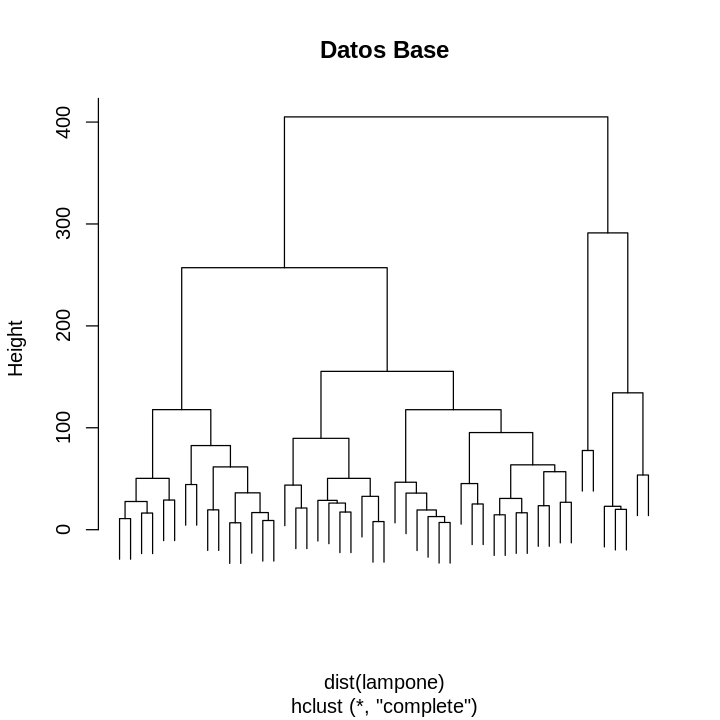

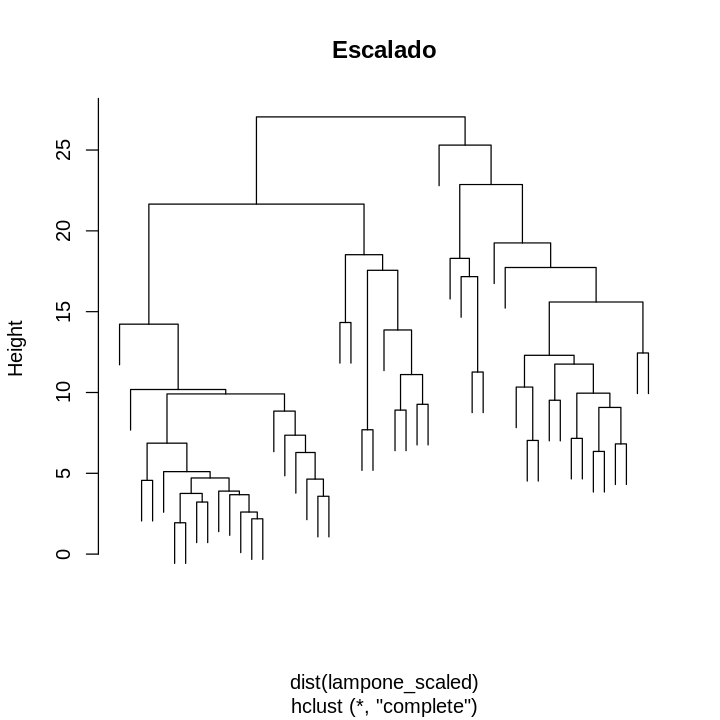

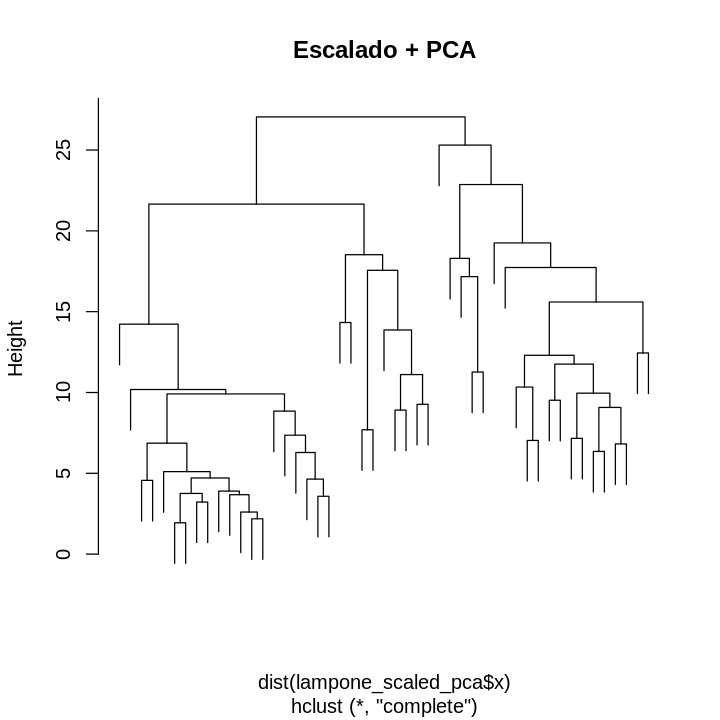

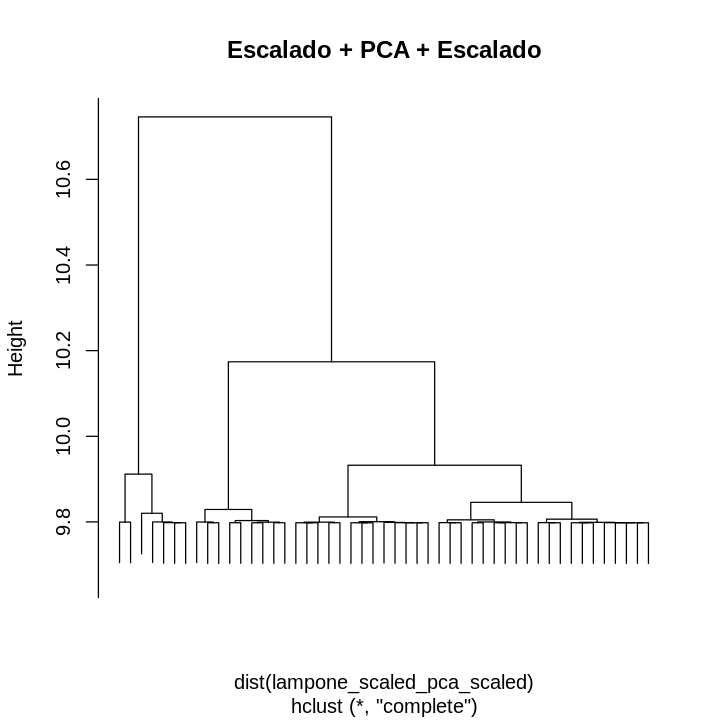

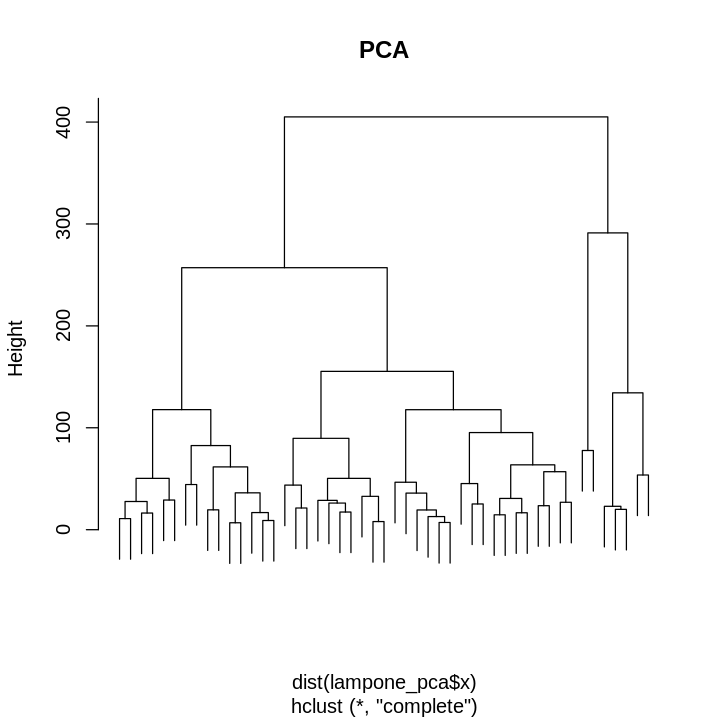

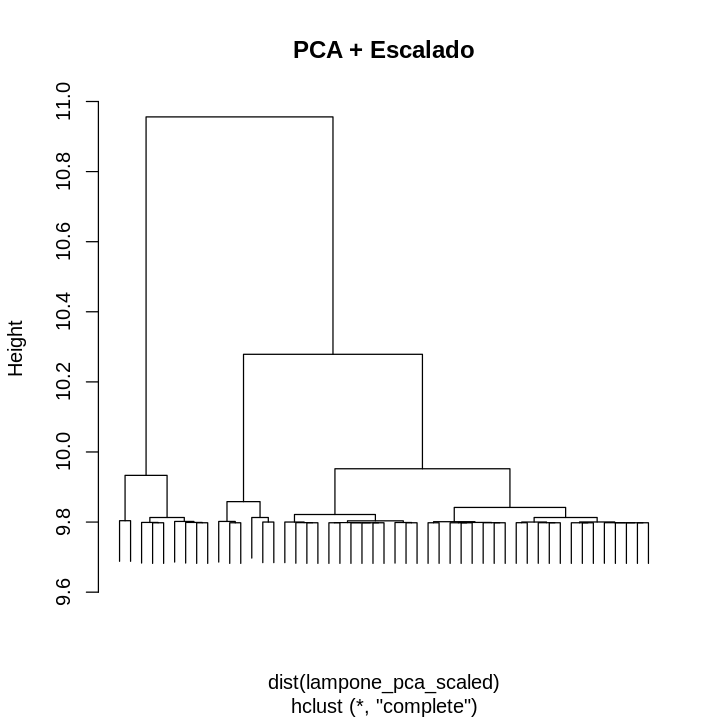

In [170]:
plot(hclust_lampone_complete, main="Datos Base", labels = FALSE)

plot(hclust_lampone_scaled_complete, main="Escalado", labels = FALSE)

plot(hclust_lampone_scaled_pca_complete, main="Escalado + PCA", labels = FALSE)

plot(hclust_lampone_scaled_pca_scaled_complete, main="Escalado + PCA + Escalado", labels = FALSE)

plot(hclust_lampone_pca_complete, main="PCA", labels = FALSE)

plot(hclust_lampone_pca_scaled_complete, main="PCA + Escalado", labels = FALSE)

Para complete linkage se pueden apreciar en las gráficas de los clusters obtenidos por los datos escalados y los datos escalados + PCA que hay dos clusters principales mas balanceados que todos los obtenidos por average linkage. Estimo que con estos vamos a tener un mejor resultado ya sea en años o en especies.

##### Análisis de clusters

In [171]:
hclust_lampone_complete_cutted <- cutree(hclust_lampone_complete, k = 2)
hclust_lampone_scaled_complete_cutted <- cutree(hclust_lampone_scaled_complete, k = 2)
hclust_lampone_scaled_pca_complete_cutted <- cutree(hclust_lampone_scaled_pca_complete, k = 2)
hclust_lampone_scaled_pca_scaled_complete_cutted <- cutree(hclust_lampone_scaled_pca_scaled_complete, k = 2)
hclust_lampone_pca_complete_cutted <- cutree(hclust_lampone_pca_complete, k = 2)
hclust_lampone_pca_scaled_complete_cutted <- cutree(hclust_lampone_pca_scaled_complete, k = 2)

##### Años

In [172]:
cat("------- Datos Base -------\n")
compare_clusters(years, hclust_lampone_complete_cutted)
cat("\n\n------- Escalado -------\n")
compare_clusters(years, hclust_lampone_scaled_complete_cutted)
cat("\n\n------- Escalado + PCA -------\n")
compare_clusters(years, hclust_lampone_scaled_pca_complete_cutted)
cat("\n\n------- Escalado + PCA + Escalado -------\n")
compare_clusters(years, hclust_lampone_scaled_pca_scaled_complete_cutted)
cat("\n\n------- PCA -------\n")
compare_clusters(years, hclust_lampone_pca_complete_cutted)
cat("\n\n------- PCA + Escalado -------\n")
compare_clusters(years, hclust_lampone_pca_scaled_complete_cutted)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.02 %
      cluster_result
class   2  1
  2006  1 18
  2007  6 24


------- Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 79.59 %
      cluster_result
class   1  2
  2006 19  0
  2007 10 20


------- Escalado + PCA -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 79.59 %
      cluster_result
class   1  2
  2006 19  0
  2007 10 20


------- Escalado + PCA + Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 55.1 %
      cluster_result
class   2  1
  2006  2 17
  2007  5 25


------- PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.02 %
      cluster_result
class   2  1
  2006  1 18
  2007  6 24


------- PCA + Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in 

Efectivamente, con estos dos datasets que parecen haber generado dos clusters principales mas balanceados, logramos obtener un 79.59% de coincidencia con las clase Años.

##### Especies

In [173]:
cat("------- Datos Base -------\n")
compare_clusters(especie, hclust_lampone_complete_cutted)
cat("\n\n------- Escalado -------\n")
compare_clusters(especie, hclust_lampone_scaled_complete_cutted)
cat("\n\n------- Escalado + PCA -------\n")
compare_clusters(especie, hclust_lampone_scaled_pca_complete_cutted)
cat("\n\n------- Escalado + PCA + Escalado -------\n")
compare_clusters(especie, hclust_lampone_scaled_pca_scaled_complete_cutted)
cat("\n\n------- PCA -------\n")
compare_clusters(especie, hclust_lampone_pca_complete_cutted)
cat("\n\n------- PCA + Escalado -------\n")
compare_clusters(especie, hclust_lampone_pca_scaled_complete_cutted)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 53.06 %
     cluster_result
class  2  1
   2   3 19
   10  4 23


------- Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 73.47 %
     cluster_result
class  1  2
   2  19  3
   10 10 17


------- Escalado + PCA -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 73.47 %
     cluster_result
class  1  2
   2  19  3
   10 10 17


------- Escalado + PCA + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 51.02 %
     cluster_result
class  1  2
   2  20  2
   10 22  5


------- PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 53.06 %
     cluster_result
class  2  1
   2   3 19
   10  4 23


------- PCA + Escalado -------
Direct agreement: 1 of 2 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 61.2

Sorprendentemente, Escalado y Escalado + PCA, también lograron un 73.47% de coincidencia con las especies

## Análisis general ej 1
El método de clusterizacion Kmeans fue en general mucho mas robusto y obtuvo resultados mucho mejores que los logrados con los clusters jerárquicos. Esto probablemente se deba a la forma de evaluar los jerárquicos.

Con respecto a los métodos de linkage, podemos ver que para el problema Crabs fue mejor utilizar average, mientras que para Lampone fue mas efectivo utilizar complete linkage. Mostrando así que no existe una "bala de plata" y muchas veces depende de nuestro problema.

Podemos destacar la importancia de ver los datos de diferentes maneras, ya que muchas cosas se encuentran solo en la PCA o solo despues de escalar por lo que es importante probar combinaciones.

# Ej 2

## GAP Statistic

In [174]:
gen_uniform_dataset <- function(data) {
  dataset_uniform <- c()
  n_row <- nrow(data)
  n_col <- ncol(data)

  data_pca <- prcomp(data)$x

  for (c in 1:n_col) {
    col <- runif(n_row, min = min(data_pca[,c]), max = max(data_pca[,c]))
    dataset_uniform <- cbind(dataset_uniform, col)
  }

  return(dataset_uniform)
}

In [175]:
gap_statistic <- function(data, maxK=10, B=100, nstart=20, iter.max = 100) {
  W_k <- c()
  Gaps <- c()
  s_k <- c()

  for (k in 1:(maxK+1)) {
    C_k <- suppressWarnings(kmeans(data, k, nstart=nstart, iter.max=iter.max))
    W_k[k] <- C_k$tot.withinss

    W_k_b <- c()
    for (b in 1:B) {
      d_b <- gen_uniform_dataset(data)
      C_k_b <- suppressWarnings(kmeans(d_b, k, nstart=nstart, iter.max=iter.max))
      W_k_b[b] <- C_k_b$tot.withinss
    }

    # Calculate Gap
    l <- mean(log(W_k_b))
    Gaps <- c(Gaps, (l - log(W_k[k])))

    # SD
    suma <- 0
    for (b in 1:B) {
      suma <- suma + (log(W_k_b[b])-l)^2
    }
    sd <- sqrt(suma/B)

    # S_k
    s_k[k] <- sd*(sqrt(1+1/B))
  }

  # Selecting k
  for (k in 1:maxK) {
    if (Gaps[k] >= (Gaps[k+1]-s_k[k+1])) {
      return(k)
    }
  }
  return(1)
}

## Estabilidad

In [176]:
stability_score <- function(n, cc1, cc2, ind1, ind2) {
  #pongo los clusters de nuevo en longitud n - quedan 0 los puntos fuera del sample.
  #Sumo 5 a las etiquetas para que valga el truco que la raiz de multiplicar las "clases" es un numero entero solo cuando tienen el mismo numero, vale para la cantidad de clusters que buscamos siempre.
  v1<-v2<-rep(0,n)
  v1[ind1]<-cc1+5
  v2[ind2]<-cc2+5
  #creo una matriz m con 1 donde los dos puntos estan en el mismo cluster, -1 en distinto cluster y 0 si alguno no esta, para cada clustering
  a<-sqrt(v1%*%t(v1))
  m1<-a / -a + 2*(a==round(a))
  m1[is.nan(m1)]<-0
  a<-sqrt(v2%*%t(v2))
  m2<-a / -a + 2*(a==round(a))
  m2[is.nan(m2)]<-0
  #calculo el score, los pares de puntos que estan en la misma situacion en los dos clustering dividido el total de pares validos.
  validos<-sum(v1*v2>0)
  score<-sum((m1*m2)[upper.tri(m1)]>0)/(validos*(validos-1)/2)
  return(score)
}

In [177]:
stability <- function(data, maxK=10, solutions=20, percentage=0.8, nstart=20, iter.max = 100) {
  n<-dim(data)[1]

  indexes <- list()

  for(i in 1:solutions) {
    indexes[[i]] <- sample(n,percentage*n)
  }

  k_score <- numeric()

  for(k in 2:maxK) {
    clusters <- list()
    for (i in 1:solutions) {
      clusters[[i]] <- suppressWarnings(kmeans(data[indexes[[i]],],k,nstart=nstart,iter.max=iter.max)$cluster)
    }

    scores <- numeric()

    for(i in 1:(solutions-1)) {
      for(j in (i+1):solutions) {
        scores <- c(scores, stability_score(n, clusters[[i]], clusters[[j]], indexes[[i]], indexes[[j]]))
      }
    }
    k_score <- c(k_score, mean(scores))
  }

  # Busco el mayor k con el mayor score promedio
  k_greatest_score <- length(k_score) - which.max(rev(k_score)) + 2

  return(k_greatest_score)
}

# Ej 3

## 4 Gaussianas

### Código de generación

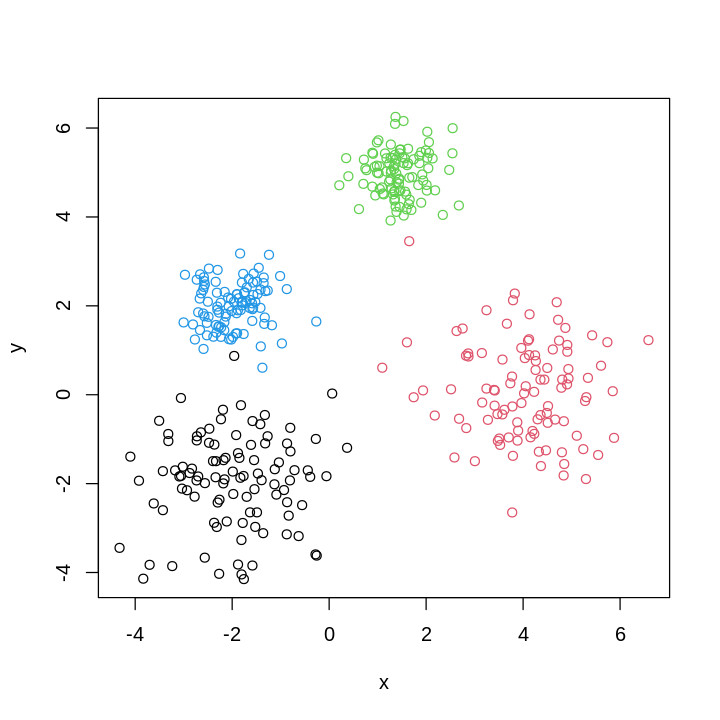

In [201]:
#cuatro clusters de dist. gaussianas
tot.puntos<-100
gap=2
x<-rnorm(tot.puntos,mean=-gap)
y<-rnorm(tot.puntos,mean=-gap)
gausianas<-cbind(x,y,rep(1,length(x)))
x<-rnorm(tot.puntos,mean=2*gap)
y<-rnorm(tot.puntos,mean=0)
gausianas<-rbind(gausianas,cbind(x,y,rep(2,length(x))))
x<-rnorm(tot.puntos,mean=0.7*gap,sd=0.5)
y<-rnorm(tot.puntos,mean=2.5*gap,sd=0.5)
gausianas<-rbind(gausianas,cbind(x,y,rep(3,length(x))))
x<-rnorm(tot.puntos,mean=-gap,sd=0.5)
y<-rnorm(tot.puntos,mean=gap,sd=0.5)
gausianas<-rbind(gausianas,cbind(x,y,rep(4,length(x))))
plot(gausianas[,1:2],col=gausianas[,3])

### Ks encontrados

In [113]:
data <- gausianas[,-3]
data_pca <- prcomp(data, scale. = TRUE)$x

k_gap <- gap_statistic(data)
k_stability_7 <- stability(data, percentage=0.7)
k_stability_8 <- stability(data, percentage=0.8)
k_stability_9 <- stability(data, percentage=0.9)

k_gap_pca <- gap_statistic(data_pca)
k_stability_pca_7 <- stability(data_pca, percentage=0.7)
k_stability_pca_8 <- stability(data_pca, percentage=0.8)
k_stability_pca_9 <- stability(data_pca, percentage=0.9)

cat("------- Datos Originales ------- \n")
cat("El K elegido con Gap Statistic es", k_gap, "\n\n")
cat("El K elegido con Stability con 70% de subsample es", k_stability_7, "\n\n")
cat("El K elegido con Stability con 80% de subsample es", k_stability_8, "\n\n")
cat("El K elegido con Stability con 90% de subsample es", k_stability_9, "\n\n\n")

cat("------- PCA con escalado ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_pca, "\n\n")
cat("El K elegido con Stability con 70% de subsample es", k_stability_pca_7, "\n\n")
cat("El K elegido con Stability con 80% de subsample es", k_stability_pca_8, "\n\n")
cat("El K elegido con Stability con 90% de subsample es", k_stability_pca_9, "\n\n\n")

------- Datos Originales ------- 
El K elegido con Gap Statistic es 4 

El K elegido con Stability con 70% de subsample es 4 

El K elegido con Stability con 80% de subsample es 4 

El K elegido con Stability con 90% de subsample es 4 


------- PCA con escalado ------- 
El K elegido con Gap Statistic es 4 

El K elegido con Stability con 70% de subsample es 4 

El K elegido con Stability con 80% de subsample es 4 

El K elegido con Stability con 90% de subsample es 4 




### Análisis
Ambos métodos lograron encontrar satisfactoriamente el valor de cuatro clusters.

Cabe destacar que por este método tuve que hacer que stability buscara el k mas grande haciendo el reverso de la lista, ya que k=2 y k=3 eran soluciones estables también.

## Iris

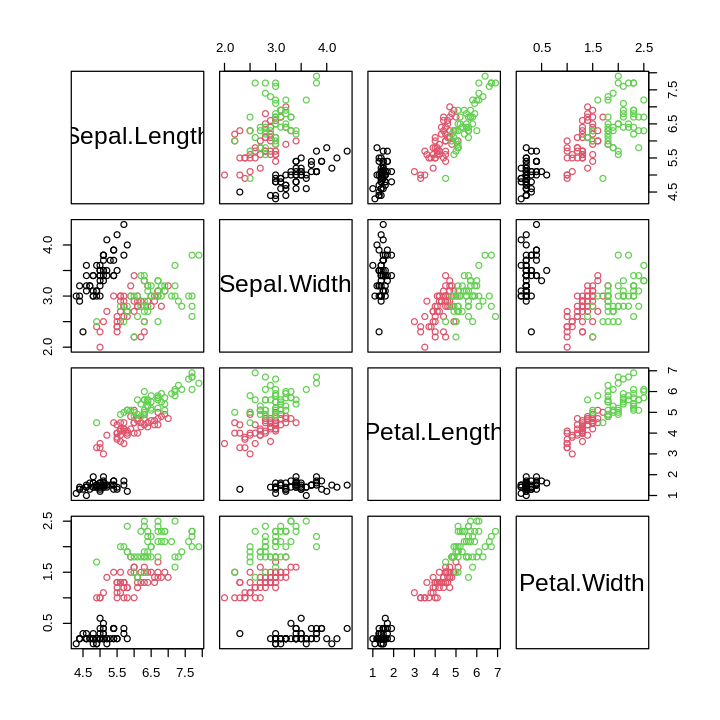

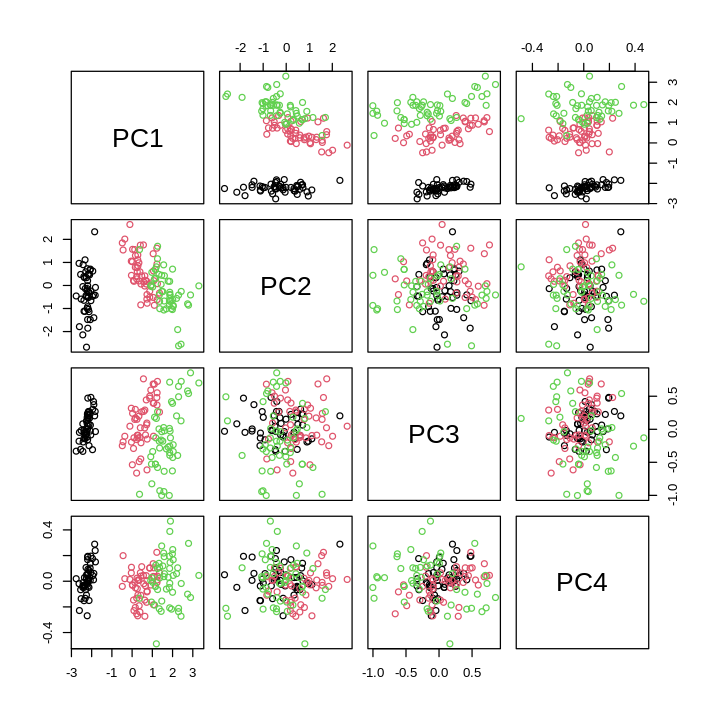

In [202]:
data <- iris[,-5]
data_pca <- prcomp(data, scale. = TRUE)$x

pairs(data, col=as.numeric(iris[,5]))
pairs(data_pca, col=as.numeric(iris[,5]))

In [ ]:
k_gap <- gap_statistic(data)
k_stability_7 <- stability(data, percentage=0.7)
k_stability_8 <- stability(data, percentage=0.8)
k_stability_9 <- stability(data, percentage=0.9)

k_gap_pca <- gap_statistic(data_pca)
k_stability_pca_7 <- stability(data_pca, percentage=0.7)
k_stability_pca_8 <- stability(data_pca, percentage=0.8)
k_stability_pca_9 <- stability(data_pca, percentage=0.9)

cat("------- Datos Originales ------- \n")
cat("El K elegido con Gap Statistic es", k_gap, "\n\n")
cat("El K elegido con Stability con 70% de subsample es", k_stability_7, "\n\n")
cat("El K elegido con Stability con 80% de subsample es", k_stability_8, "\n\n")
cat("El K elegido con Stability con 90% de subsample es", k_stability_9, "\n\n\n")

cat("------- PCA con escalado ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_pca, "\n\n")
cat("El K elegido con Stability con 70% de subsample es", k_stability_pca_7, "\n\n")
cat("El K elegido con Stability con 80% de subsample es", k_stability_pca_8, "\n\n")
cat("El K elegido con Stability con 90% de subsample es", k_stability_pca_9, "\n\n\n")

------- Datos Originales ------- 
El K elegido con Gap Statistic es 5 

El K elegido con Stability con 70% de subsample es 2 

El K elegido con Stability con 80% de subsample es 2 

El K elegido con Stability con 90% de subsample es 2 


------- PCA con escalado ------- 
El K elegido con Gap Statistic es 3 

El K elegido con Stability con 70% de subsample es 2 

El K elegido con Stability con 80% de subsample es 2 

El K elegido con Stability con 90% de subsample es 2 




### Análisis

Con este problema me sucede que Stability se queda corto, encontrando solo dos clusters, cuando hice el análisis de los puntajes, k=3 también era alto, pero al elegirlo haciendo un which.max no lo puede obtener, probablemente si se usara otro método para elegir el k, se lograria obtener el valor deseado. De todas formas no es un valor raro el de dos clusters ya que sabemos que las clases 2 y 3 estan muy juntas y podrian ser consideradas como un solo cluster.

Con respecto a Gap Statistic, con los datos originales determinó que habia mas clusters que los que buscamos, supongo que esto se debe a que encontraba mas centros en la zona de las dos clases que estan muy alargadas. Pero al usar la PCA con escalado logró obtener los 3 clusters satisfactoriamente, Miramos la gráfica de pares de la PCA se puede ver como las clases 2 y 3 se separan mejor que en los datos originales, esto es lo que hace que el método tenga un mejor funcionamiento.

## Lampone

Para este dataset tuve que pasarle la PCA como dato, esto lo hice porque la PCA tiene menos dimensiones que el dataset original y esto hacia que GAP Statistic rompiera cuando quería generar los datasets de ruído uniforme.

In [ ]:
data <- prcomp(lampone, scale. = TRUE)$x
k_gap <- gap_statistic(data)
k_stability_7 <- stability(data, percentage=0.7)
k_stability_8 <- stability(data, percentage=0.8)
k_stability_9 <- stability(data, percentage=0.9)

cat("------- PCA con escalado ------- \n")
cat("El K elegido con Gap Statistic es", k_gap, "\n\n")
cat("El K elegido con Stability con 70% de subsample es", k_stability_7, "\n\n")
cat("El K elegido con Stability con 80% de subsample es", k_stability_8, "\n\n")
cat("El K elegido con Stability con 90% de subsample es", k_stability_9, "\n\n\n")

------- PCA con escalado ------- 
El K elegido con Gap Statistic es 3 

El K elegido con Stability con 70% de subsample es 2 

El K elegido con Stability con 80% de subsample es 2 

El K elegido con Stability con 90% de subsample es 2 




### Análisis
En este dataset Gap Statistic determinó que hay tres clusters, me resulta raro ya que esperaria o dos o cuatro (dos por los años, cuatro por años + especie). Tal vez encuentra por un lado los clusters de años y luego esta pratiendo alguno de esos dos clusters en otros dos por las especies.

Stability solo logró determinar dos clusters, probablemente la division por años que es la que habiamos encontrado en el ejercicio 2.

## Ruído uniforme

Decidí probar que pasa cuando se trata de predecir clusters en un dataset de ruído uniforme.

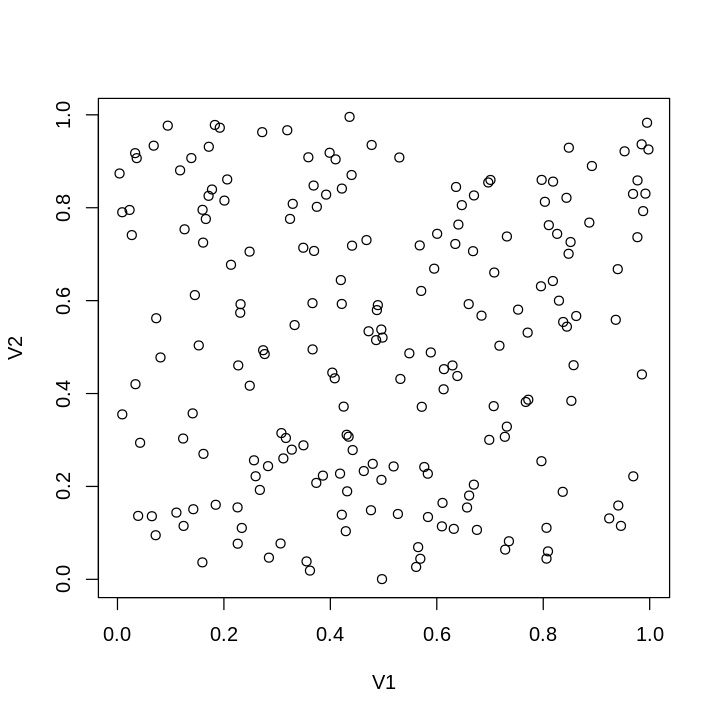

In [203]:
generate_uniform_dataset <- function(n_rows) {
  uniform <- data.frame(
    V1 = runif(n_rows, min = 0, max = 1),
    V2 = runif(n_rows, min = 0, max = 1)
  )
  return(uniform)
}

uniform <- generate_uniform_dataset(200)
plot(uniform)

In [111]:
data <- uniform
data_pca <- prcomp(data, scale. = TRUE)$x

k_gap <- gap_statistic(data)
k_stability_7 <- stability(data, percentage=0.7)
k_stability_8 <- stability(data, percentage=0.8)
k_stability_9 <- stability(data, percentage=0.9)

k_gap_pca <- gap_statistic(data_pca)
k_stability_pca_7 <- stability(data_pca, percentage=0.7)
k_stability_pca_8 <- stability(data_pca, percentage=0.8)
k_stability_pca_9 <- stability(data_pca, percentage=0.9)

cat("------- Datos Originales ------- \n")
cat("El K elegido con Gap Statistic es", k_gap, "\n\n")
cat("El K elegido con Stability con 70% de subsample es", k_stability_7, "\n\n")
cat("El K elegido con Stability con 80% de subsample es", k_stability_8, "\n\n")
cat("El K elegido con Stability con 90% de subsample es", k_stability_9, "\n\n\n")

cat("------- PCA con escalado ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_pca, "\n\n")
cat("El K elegido con Stability con 70% de subsample es", k_stability_pca_7, "\n\n")
cat("El K elegido con Stability con 80% de subsample es", k_stability_pca_8, "\n\n")
cat("El K elegido con Stability con 90% de subsample es", k_stability_pca_9, "\n\n\n")

------- Datos Originales ------- 
El K elegido con Gap Statistic es 1 

El K elegido con Stability con 70% de subsample es 4 

El K elegido con Stability con 80% de subsample es 4 

El K elegido con Stability con 90% de subsample es 4 


------- PCA con escalado ------- 
El K elegido con Gap Statistic es 1 

El K elegido con Stability con 70% de subsample es 4 

El K elegido con Stability con 80% de subsample es 4 

El K elegido con Stability con 90% de subsample es 4 




### Análisis
Gap statistic pudo determinar que no habia ningún cluster de manera satisfactoria, mientras que stability al no tener forma de determinar que no hay un cluster (ya que buscamos la solucion "mas" estable, siempre se encuentra una a pesar de que ninguna sea estable) siempre nos devuelve un valor que al volver a correr el experimento cambia.

# Ej 4

Para este ejercicio decidí utilizar un dataset de información sobre miembros de un gimnasio y sus entrenamientos.
https://www.kaggle.com/datasets/valakhorasani/gym-members-exercise-dataset

Las variables son las siguientes:


1.   Edad
2.   Género
3.   Peso
4.   Altura
5.   BPM (latidos por minuto) Máximo
6.   BPM (latidos por minuto) Promedio
7.   BPM (latidos por minuto) en resposo
8.   Duracion de las sesiones
9.   Calorias quemadas
10.   Tipos de entrenamiento
11.   Porcentaje de grasa
12.   Ingesta de agua
13.   Frecuencia de entrenamiento
14.   Nivel de experiencia
14.   BMI (Indice de Masa Corporal)




In [178]:
gym_dataset <- read.csv("/content/gym_members_exercise_tracking.csv")
summary(gym_dataset)

      Age           Gender           Weight..kg.       Height..m.   
 Min.   :18.00   Length:973         Min.   : 40.00   Min.   :1.500  
 1st Qu.:28.00   Class :character   1st Qu.: 58.10   1st Qu.:1.620  
 Median :40.00   Mode  :character   Median : 70.00   Median :1.710  
 Mean   :38.68                      Mean   : 73.85   Mean   :1.723  
 3rd Qu.:49.00                      3rd Qu.: 86.00   3rd Qu.:1.800  
 Max.   :59.00                      Max.   :129.90   Max.   :2.000  
    Max_BPM         Avg_BPM       Resting_BPM    Session_Duration..hours.
 Min.   :160.0   Min.   :120.0   Min.   :50.00   Min.   :0.500           
 1st Qu.:170.0   1st Qu.:131.0   1st Qu.:56.00   1st Qu.:1.040           
 Median :180.0   Median :143.0   Median :62.00   Median :1.260           
 Mean   :179.9   Mean   :143.8   Mean   :62.22   Mean   :1.256           
 3rd Qu.:190.0   3rd Qu.:156.0   3rd Qu.:68.00   3rd Qu.:1.460           
 Max.   :199.0   Max.   :169.0   Max.   :74.00   Max.   :2.000           

In [179]:
print(unique(gym_dataset$Gender))

[1] "Male"   "Female"


In [180]:
print(unique(gym_dataset$Experience_Level))

[1] 3 2 1


In [181]:
print(unique(gym_dataset$Workout_Type))

[1] "Yoga"     "HIIT"     "Cardio"   "Strength"


Podemos ver que tenemos tres categorias que podrian ser clusterizadas por lo que vamos a sacarlas del dataset y luego generar clusters para ver si logramos clusterizarlas.

Primero veamos cuantos clusters recomiendan los metodos desarrollados en el ejercicio 2.

In [182]:
gender <- gym_dataset$Gender
XP <- gym_dataset$Experience_Level
type <- gym_dataset$Workout_Type

data <- gym_dataset[, -c(2, 10, 14)]

Para hacer los análisis decidí utilizar los siguientes datasets:


1.   Datos base
2.   Transformación Logaritmica
3.   Transformación Logaritmica + Escalado
4.   Transformación Logaritmica + Escalado + PCA
5.   Transformación Logaritmica + Escalado + PCA + Escalado
6.   Escalado
7.   Escalado + PCA
8.   Escalado + PCA + Escalado
9.   PCA
10.  PCA + Escalado



In [183]:
data_log <- log(data)
data_log_scaled <- scale(data_log)
data_log_scaled_pca <- prcomp(data_log)
data_log_scaled_pca_scaled <- scale(data_log_scaled_pca$x)
data_scaled <- scale(data)
data_scaled_pca <- prcomp(data_scaled)
data_scaled_pca_scaled <- scale(data_scaled_pca$x)
data_pca <- prcomp(data)
data_pca_scaled <- scale(data_pca$x)

## Determinar cantidad de clusters

In [ ]:
print("Start")
k_stability_data <- stability(data)
k_gap_data <- gap_statistic(data)
print("Finished data")

k_stability_data_log <- stability(data_log)
k_gap_data_log <- gap_statistic(data_log)
print("Finished data_log")

k_stability_data_log_scaled <- stability(data_log_scaled)
k_gap_data_log_scaled <- gap_statistic(data_log_scaled)
print("Finished data_log_scaled")

k_stability_data_log_scaled_pca <- stability(data_log_scaled_pca$x)
k_gap_data_log_scaled_pca <- gap_statistic(data_log_scaled_pca$x)
print("Finished data_log_scaled_pca")

k_stability_data_log_scaled_pca_scaled <- stability(data_log_scaled_pca_scaled)
k_gap_data_log_scaled_pca_scaled <- gap_statistic(data_log_scaled_pca_scaled)
print("Finished data_log_scaled_pca_scaled")

k_stability_data_scaled <- stability(data_scaled)
k_gap_data_scaled <- gap_statistic(data_scaled)
print("Finished data_scaled")

k_stability_data_scaled_pca <- stability(data_scaled_pca$x)
k_gap_data_scaled_pca <- gap_statistic(data_scaled_pca$x)
print("Finished data_scaled_pca")

k_stability_data_scaled_pca_scaled <- stability(data_scaled_pca_scaled)
k_gap_data_scaled_pca_scaled <- gap_statistic(data_scaled_pca_scaled)
print("Finished data_scaled_pca_scaled")

k_stability_data_pca <- stability(data_pca$x)
k_gap_data_pca <- gap_statistic(data_pca$x)
print("Finished data_pca")

k_stability_data_pca_scaled <- stability(data_pca_scaled)
k_gap_data_pca_scaled <- gap_statistic(data_pca_scaled)
print("Finished data_pca_scaled")

[1] "Start"
[1] "Finished data"
[1] "Finished data_log"
[1] "Finished data_log_scaled"
[1] "Finished data_log_scaled_pca"
[1] "Finished data_log_scaled_pca_scaled"
[1] "Finished data_scaled"
[1] "Finished data_scaled_pca"
[1] "Finished data_scaled_pca_scaled"
[1] "Finished data_pca"
[1] "Finished data_pca_scaled"


In [ ]:
cat("------- Datos Originales ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data, "\n\n")
cat("El K elegido con Stability es", k_stability_data, "\n\n\n")

cat("------- Transformacion Logaritmica ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data_log, "\n\n")
cat("El K elegido con Stability es", k_stability_data_log, "\n\n")

cat("------- Transformacion Logaritmica + Escalado ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data_log_scaled, "\n\n")
cat("El K elegido con Stability es", k_stability_data_log_scaled, "\n\n")

cat("------- Transformacion Logaritmica + Escalado + PCA ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data_log_scaled_pca, "\n\n")
cat("El K elegido con Stability es", k_stability_data_log_scaled_pca, "\n\n")

cat("------- Transformacion Logaritmica + Escalado + PCA + Escalado ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data_log_scaled_pca_scaled, "\n\n")
cat("El K elegido con Stability es", k_stability_data_log_scaled_pca_scaled, "\n\n")

cat("------- Escalado ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data_scaled, "\n\n")
cat("El K elegido con Stability es", k_stability_data_scaled, "\n\n")

cat("------- Escalado + PCA ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data_scaled_pca, "\n\n")
cat("El K elegido con Stability es", k_stability_data_scaled_pca, "\n\n")

cat("------- Escalado + PCA + Escalado ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data_scaled_pca_scaled, "\n\n")
cat("El K elegido con Stability es", k_stability_data_scaled_pca_scaled, "\n\n")

cat("-------  PCA ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data_pca, "\n\n")
cat("El K elegido con Stability es", k_stability_data_pca, "\n\n")

cat("------- PCA + Escalado ------- \n")
cat("El K elegido con Gap Statistic es", k_gap_data_pca_scaled, "\n\n")
cat("El K elegido con Stability es", k_stability_data_pca_scaled, "\n\n")

------- Datos Originales ------- 
El K elegido con Gap Statistic es 1 

El K elegido con Stability es 9 


------- Transformacion Logaritmica ------- 
El K elegido con Gap Statistic es 1 

El K elegido con Stability es 5 

------- Transformacion Logaritmica + Escalado ------- 
El K elegido con Gap Statistic es 1 

El K elegido con Stability es 3 

------- Transformacion Logaritmica + Escalado + PCA ------- 
El K elegido con Gap Statistic es 1 

El K elegido con Stability es 5 

------- Transformacion Logaritmica + Escalado + PCA + Escalado ------- 
El K elegido con Gap Statistic es 1 

El K elegido con Stability es 7 

------- Escalado ------- 
El K elegido con Gap Statistic es 3 

El K elegido con Stability es 3 

------- Escalado + PCA ------- 
El K elegido con Gap Statistic es 3 

El K elegido con Stability es 3 

------- Escalado + PCA + Escalado ------- 
El K elegido con Gap Statistic es 1 

El K elegido con Stability es 10 

-------  PCA ------- 
El K elegido con Gap Statistic es

Podemos ver que en casi todos los casos Gap Statistic determinó que no habia clusters, solo encontró que habia tres clusters con los datos escalados y con la pca de los datos escalados. En estos dos casos también se dio que Stability tambien determinó que hay tres clusters, por lo que amerita hacer una busqueda de estos y ver que se puede observar.

### Buscando 3 clusters

Busquemos los 3 clusters sobre los datos escalados y los datos escalados + PCA

In [184]:
kmeans_data_scaled <- kmeans(data_scaled, centers=3, nstart = 20)
kmeans_data_scaled_pca <- kmeans(data_scaled_pca$x, centers=3, nstart = 20)

Veamos en los datos escalados si se pueden ver clusters usando pares de variables

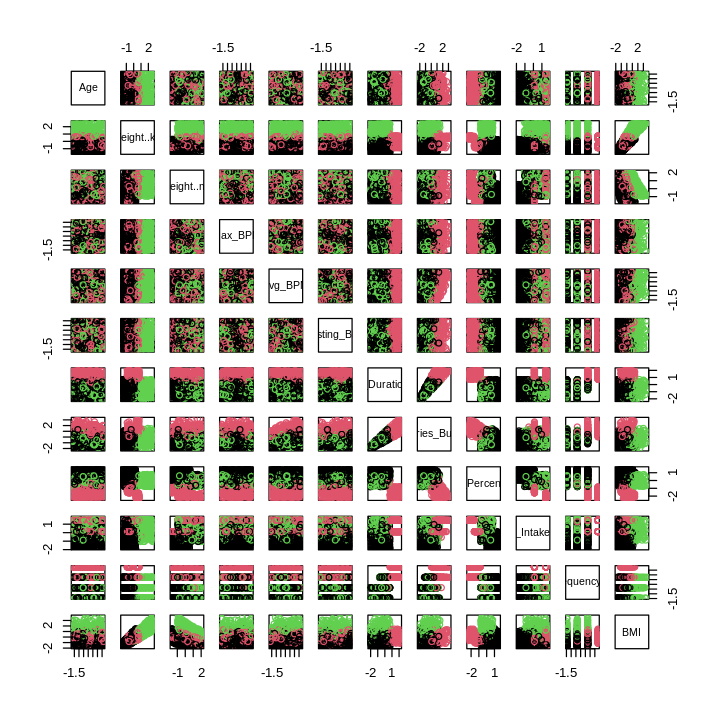

In [185]:
pairs(data_scaled, col=as.numeric(as.factor(kmeans_data_scaled$cluster)))

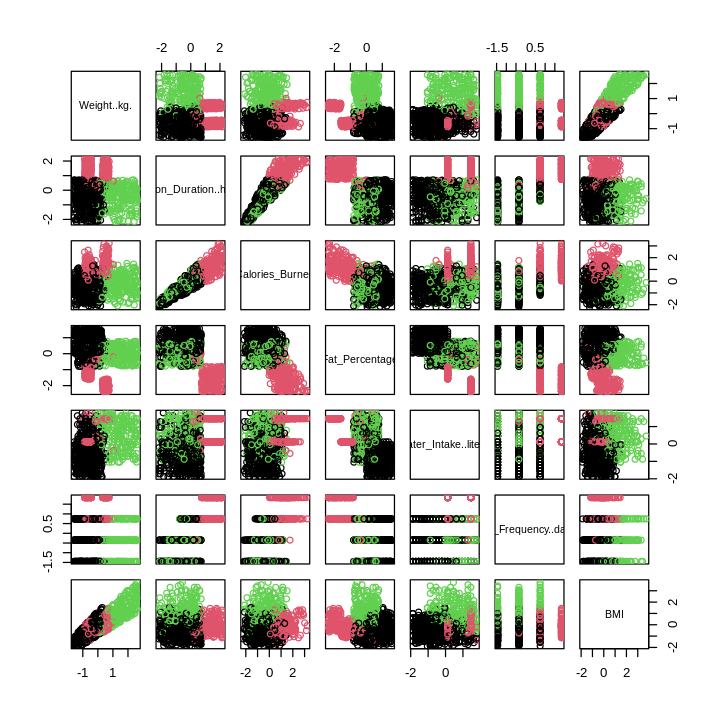

In [186]:
pairs(data_scaled[,c(2,7,8,9,10,11,12)], col=as.numeric(as.factor(kmeans_data_scaled$cluster)))

Se ouede ver como en ciertos pares de variables hay 3 grupos marcados, como puede ser BMI con Fat_percentage o peso con duración de sesión.

Veamos en la PCA

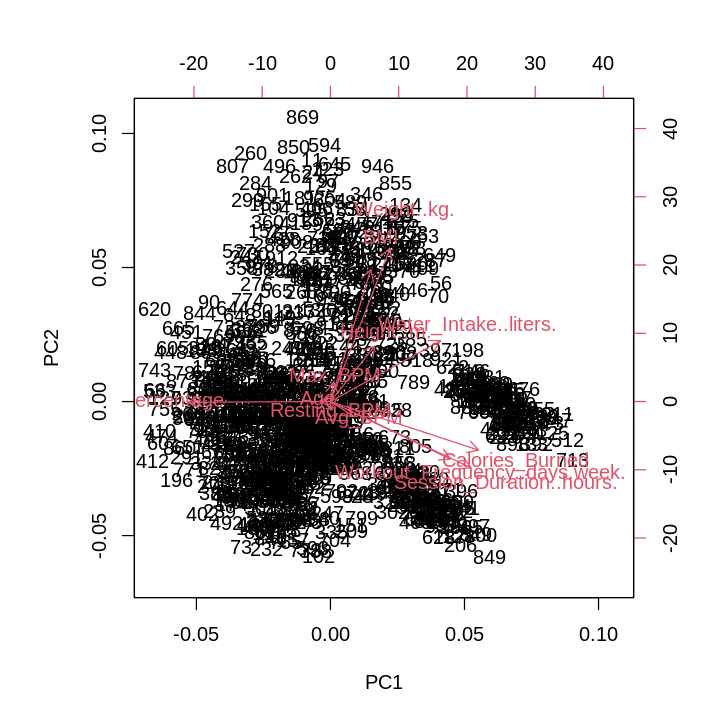

In [187]:
biplot(data_scaled_pca)

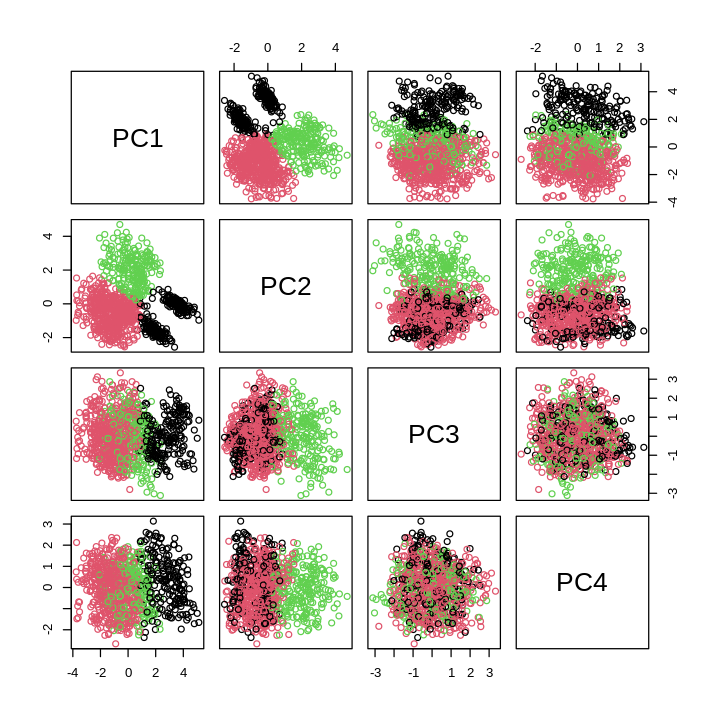

In [188]:
pairs(data_scaled_pca$x[,1:4], col=as.numeric(as.factor(kmeans_data_scaled_pca$cluster)))

En la PCA, mirando las primeras 2 variables de esta, podemos ver muy claramente los tres centros encontrados. Si en lugar de utilizar la PCA entera, solo utilizaramos las primeras 2 dimensiones de la misma, estimo que se podrian encontrar 4 centros, ya que la clase de color verde se podría dividir en dos.

## Género

Vamos a buscar dos clusters para ver si podemos determinar el género

In [189]:
centers = 2
kmeans_k2_data <- kmeans(data, centers=centers, nstart = 20)
kmeans_k2_data_log <- kmeans(data_log, centers=centers, nstart = 20)
kmeans_k2_data_log_scaled <- kmeans(data_log_scaled, centers=centers, nstart = 20)
kmeans_k2_data_log_scaled_pca <- kmeans(data_log_scaled_pca$x, centers=centers, nstart = 20)
kmeans_k2_data_log_scaled_pca_scaled <- kmeans(data_log_scaled_pca_scaled, centers=centers, nstart = 20)
kmeans_k2_data_scaled <- kmeans(data_scaled, centers=centers, nstart = 20)
kmeans_k2_data_scaled_pca <- kmeans(data_scaled_pca$x, centers=centers, nstart = 20)
kmeans_k2_data_scaled_pca_scaled <- kmeans(data_scaled_pca_scaled, centers=centers, nstart = 20)
kmeans_k2_data_pca <- kmeans(data_pca$x, centers=centers, nstart = 20)
kmeans_k2_data_pca_scaled <- kmeans(data_pca_scaled, centers=centers, nstart = 20)

In [190]:
cat("------- Datos Base -------\n")
compare_clusters(gender, kmeans_k2_data$cluster)
cat("\n\n------- Transformacion Logaritmica -------\n")
compare_clusters(gender, kmeans_k2_data_log$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado -------\n")
compare_clusters(gender, kmeans_k2_data_log_scaled$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA -------\n")
compare_clusters(gender, kmeans_k2_data_log_scaled_pca$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(gender, kmeans_k2_data_log_scaled_pca_scaled$cluster)
cat("\n\n------- Escalado -------\n")
compare_clusters(gender, kmeans_k2_data_scaled$cluster)
cat("\n\n------- Escalado + PCA -------\n")
compare_clusters(gender, kmeans_k2_data_scaled_pca$cluster)
cat("\n\n------- Escalado + PCA + Escalado-------\n")
compare_clusters(gender, kmeans_k2_data_scaled_pca_scaled$cluster)
cat("\n\n------- PCA -------\n")
compare_clusters(gender, kmeans_k2_data_pca$cluster)
cat("\n\n------- PCA + Escalado -------\n")
compare_clusters(gender, kmeans_k2_data_pca_scaled$cluster)

------- Datos Base -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 56.32 %
        cluster_result
class      2   1
  Female 289 173
  Male   252 259


------- Transformacion Logaritmica -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 61.87 %
        cluster_result
class      2   1
  Female 367  95
  Male   276 235


------- Transformacion Logaritmica + Escalado -------
Direct agreement: 2 of 2 pairs
Cases in matched pairs: 69.37 %
        cluster_result
class      1   2
  Female 368  94
  Male   204 307


------- Transformacion Logaritmica + Escalado + PCA -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 62.28 %
        cluster_result
class      2   1
  Female 367  95
  Male   272 239


------- Transformacion Logaritmica + Escalado + PCA + Escalado -------
Direct agreement: 0 of 2 pairs
Iterations for permutation matching: 2

Utilizando los datos con una transformacion logaritmica y luego escalados pudimos obtener un 69.37% de coincidencia con los géneros.

Graficamos el que mejor resultado obtuvimos:

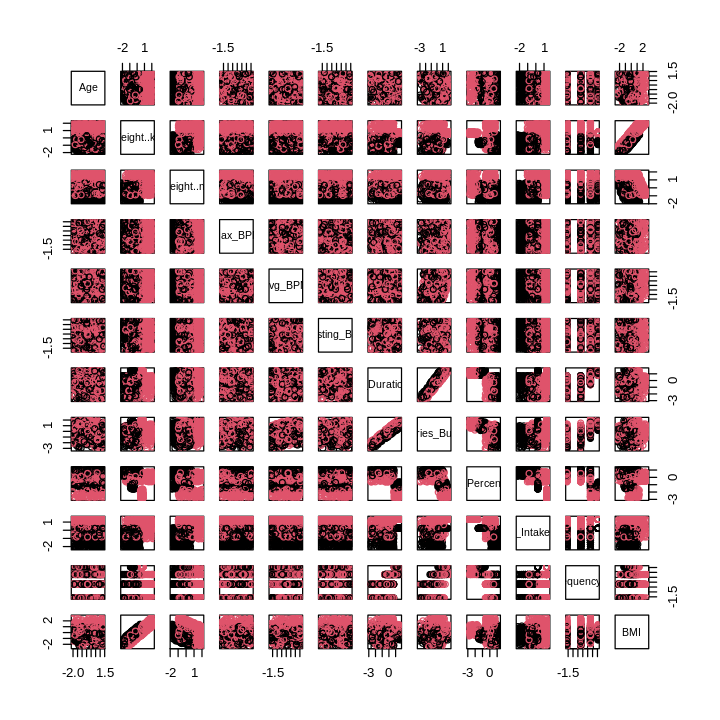

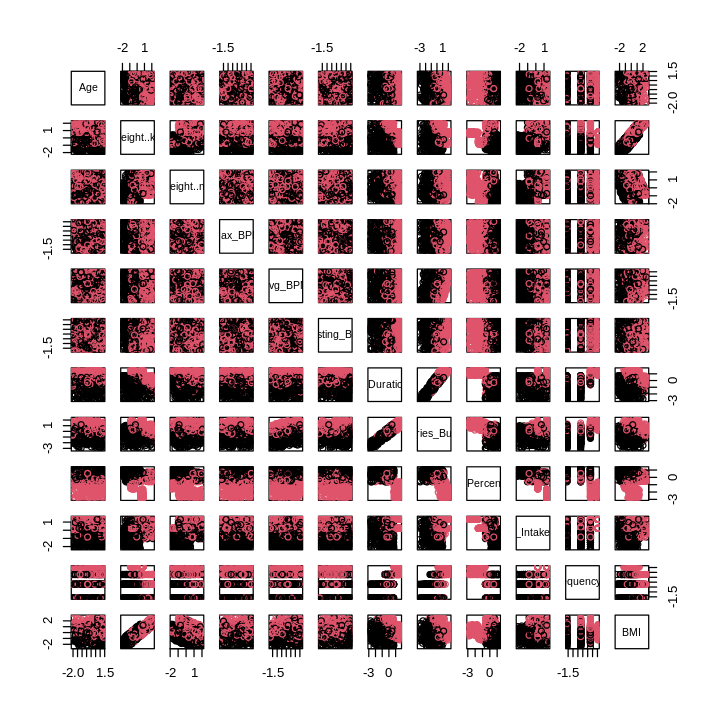

In [191]:
pairs(data_log_scaled, col=as.numeric(as.factor(gender)))
pairs(data_log_scaled, col=as.numeric(as.factor(kmeans_k2_data_log_scaled$cluster)))

Quedandonos solo con las variables que mejor diferencian los géneros

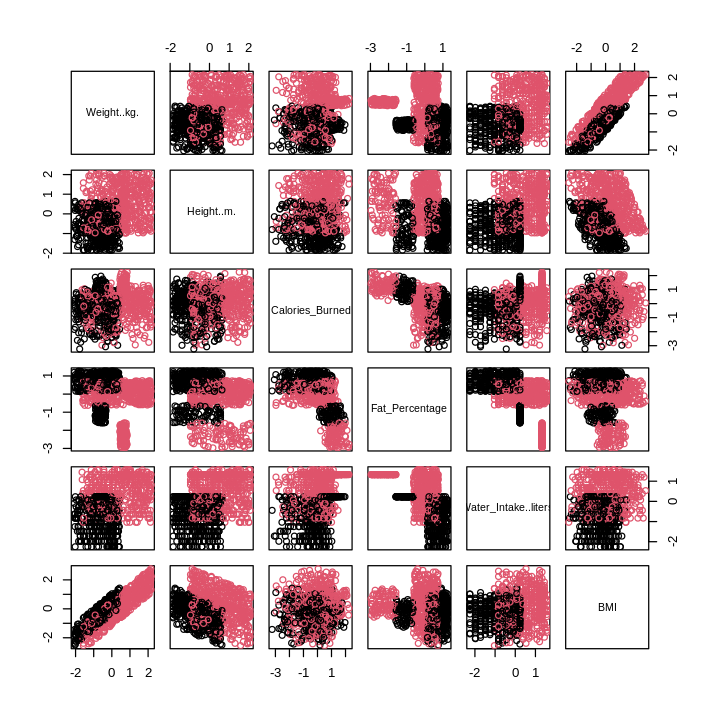

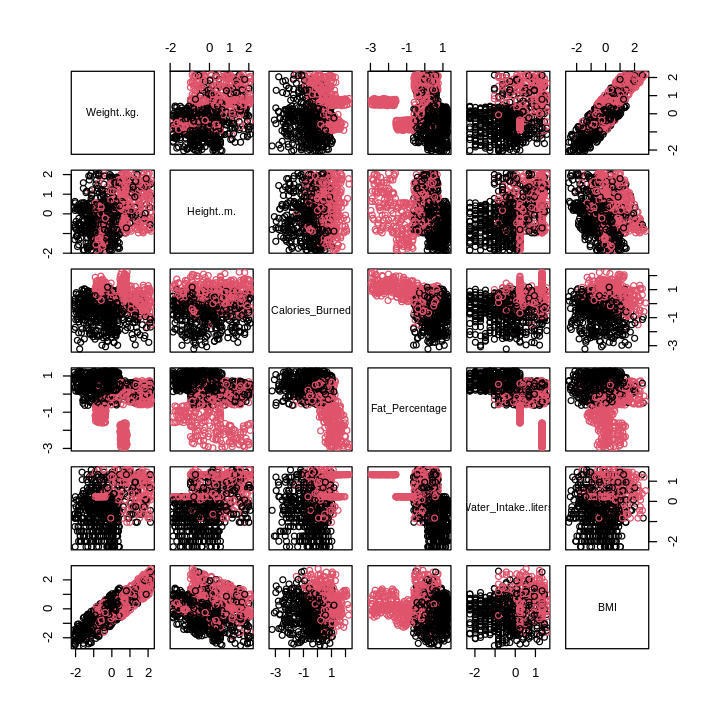

In [192]:
pairs(data_log_scaled[,c(2,3,8,9,10,12)], col=as.numeric(as.factor(gender)))
pairs(data_log_scaled[,c(2,3,8,9,10,12)], col=as.numeric(as.factor(kmeans_k2_data_log_scaled$cluster)))

Como era esperable, lo que mas parece separar los géneros es por un lado el peso y la altura de las personas, es normal que estas variables diferencien por género. Lo mismo sucede con el porcentaje de grasa, este número suele ser mas alto en las mujeres.

Comparando los clusters encontrados podemos ver que los datos para las variables como peso y altura estan peor agrupados, esto debe ser por la influencia de otras variables. Estimo que si limitaramos a buscar clusters utilizando solo las variables que más separan por género obtendriamos mejores resultados.

## Experiencia

Ahora busquemos clusters tratando de agrupar por la experiencia de las personas

In [193]:
centers = 3
kmeans_k3_data <- kmeans(data, centers=centers, nstart = 20)
kmeans_k3_data_log <- kmeans(data_log, centers=centers, nstart = 20)
kmeans_k3_data_log_scaled <- kmeans(data_log_scaled, centers=centers, nstart = 20)
kmeans_k3_data_log_scaled_pca <- kmeans(data_log_scaled_pca$x, centers=centers, nstart = 20)
kmeans_k3_data_log_scaled_pca_scaled <- kmeans(data_log_scaled_pca_scaled, centers=centers, nstart = 20)
kmeans_k3_data_scaled <- kmeans(data_scaled, centers=centers, nstart = 20)
kmeans_k3_data_scaled_pca <- kmeans(data_scaled_pca$x, centers=centers, nstart = 20)
kmeans_k3_data_scaled_pca_scaled <- kmeans(data_scaled_pca_scaled, centers=centers, nstart = 20)
kmeans_k3_data_pca <- kmeans(data_pca$x, centers=centers, nstart = 20)
kmeans_k3_data_pca_scaled <- kmeans(data_pca_scaled, centers=centers, nstart = 20)

In [194]:
cat("------- Datos Base -------\n")
compare_clusters(XP, kmeans_k3_data$cluster)
cat("\n\n------- Transformacion Logaritmica -------\n")
compare_clusters(XP, kmeans_k3_data_log$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado -------\n")
compare_clusters(XP, kmeans_k3_data_log_scaled$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA -------\n")
compare_clusters(XP, kmeans_k3_data_log_scaled_pca$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(XP, kmeans_k3_data_log_scaled_pca_scaled$cluster)
cat("\n\n------- Escalado -------\n")
compare_clusters(XP, kmeans_k3_data_scaled$cluster)
cat("\n\n------- Escalado + PCA -------\n")
compare_clusters(XP, kmeans_k3_data_scaled_pca$cluster)
cat("\n\n------- Escalado + PCA + Escalado-------\n")
compare_clusters(XP, kmeans_k3_data_scaled_pca_scaled$cluster)
cat("\n\n------- PCA -------\n")
compare_clusters(XP, kmeans_k3_data_pca$cluster)
cat("\n\n------- PCA + Escalado -------\n")
compare_clusters(XP, kmeans_k3_data_pca_scaled$cluster)

------- Datos Base -------
Direct agreement: 2 of 3 pairs
Iterations for permutation matching: 1 
Cases in matched pairs: 66.39 %
     cluster_result
class   1   2   3
    1 215 140  21
    2  87 273  46
    3   0  33 158


------- Transformacion Logaritmica -------
Direct agreement: 1 of 3 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 63.21 %
     cluster_result
class   2   1   3
    1 232 143   1
    2 210 192   4
    3   0   0 191


------- Transformacion Logaritmica + Escalado -------
Direct agreement: 1 of 3 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 59.92 %
     cluster_result
class   2   3   1
    1 254 120   2
    2 253 138  15
    3   0   0 191


------- Transformacion Logaritmica + Escalado + PCA -------
Direct agreement: 1 of 3 pairs
Iterations for permutation matching: 2 
Cases in matched pairs: 63.21 %
     cluster_result
class   3   1   2
    1 232 143   1
    2 210 192   4
    3   0   0 191


------- Transformacion Logar

Podemos ver que utilizando los datos base y la PCA se puedo obtener clusters que coinciden en un 66.39% con la experiencia, teniendo en cuenta que tenemos tres niveles de experiencia, este es un muy buen resultado. Mirando las coincidencia, la tercera clase (mayor experiencia) parece ser la mas fácil de agrupar, teniendo incluso en algunos de los datasets un 100% de agrupacion de estos puntos.

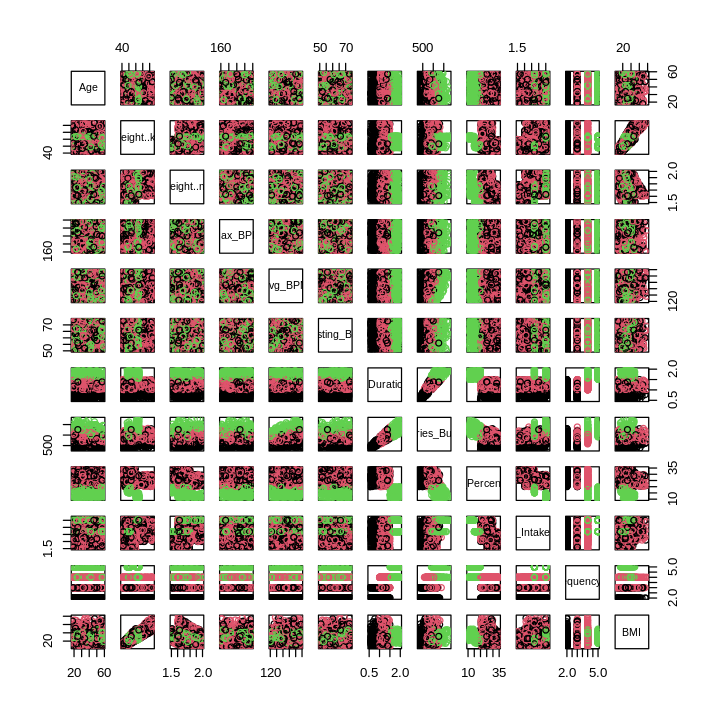

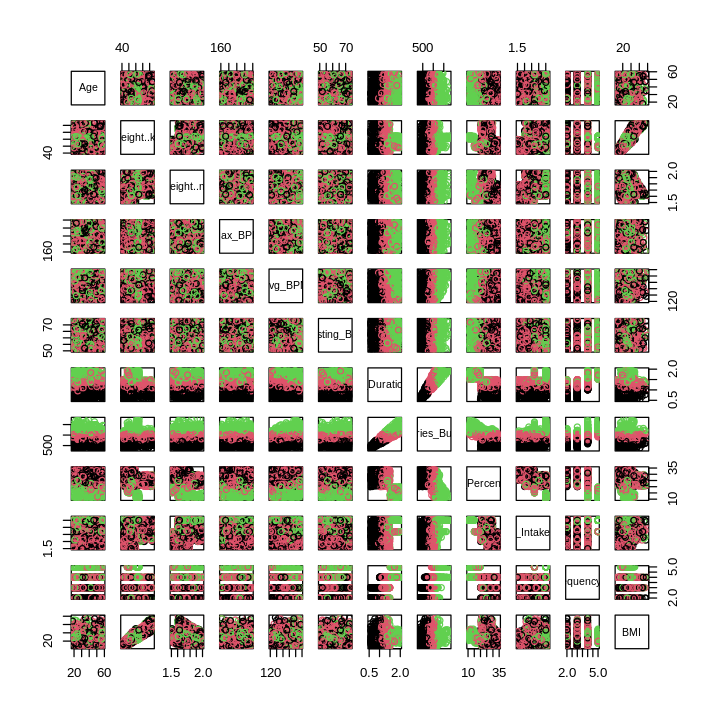

In [195]:
pairs(data, col=as.numeric(as.factor(XP)))
pairs(data, col=as.numeric(as.factor(kmeans_k3_data$cluster)))

Miremos las variables que parecen separar mejor los datos

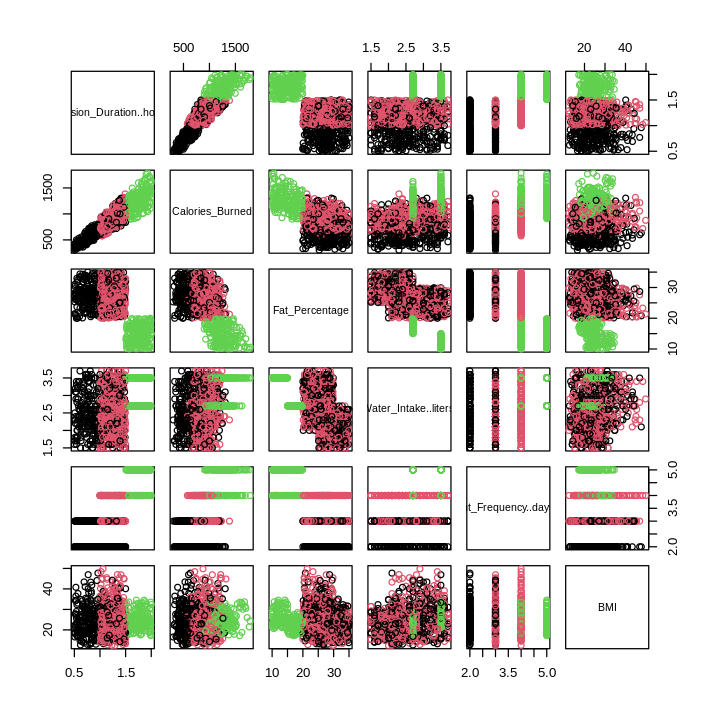

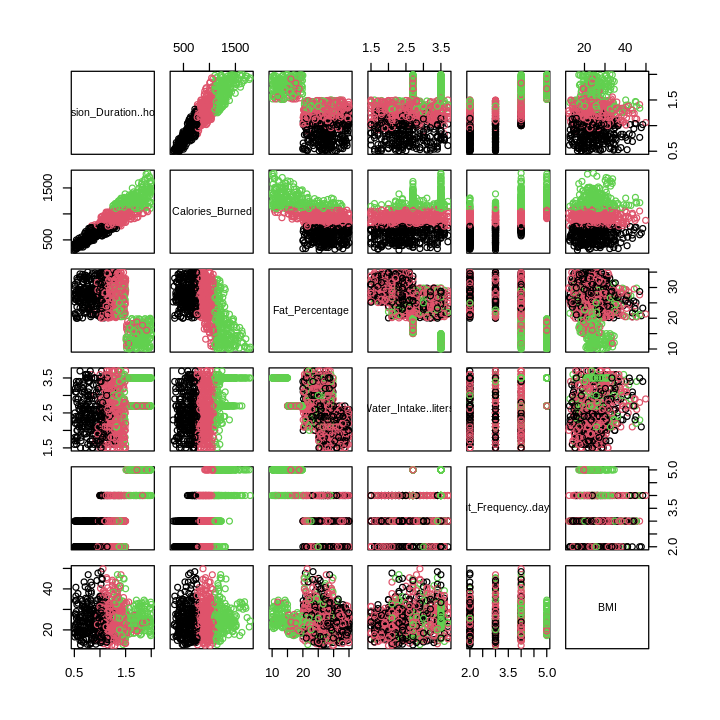

In [196]:
pairs(data[, 7:12], col=as.numeric(as.factor(XP)))
pairs(data[, 7:12], col=as.numeric(as.factor(kmeans_k3_data$cluster)))

Si comparamos los clusters obtenidos con las clases originales podemos ver que los centros coinciden, el problema me parece que esta que kmeans busca Gaussianas y estos datos no estan distribuidos como Gaussianas perfectas.

Podemos ver que hay una relación muy clara entre la duración de las sesiones y el nivel de experiencia, también con el porcentaje de grasa, donde las personas con mucha experiencia parecen tener valores mucho mas bajos.

Ahora miremos esto mismo en la PCA

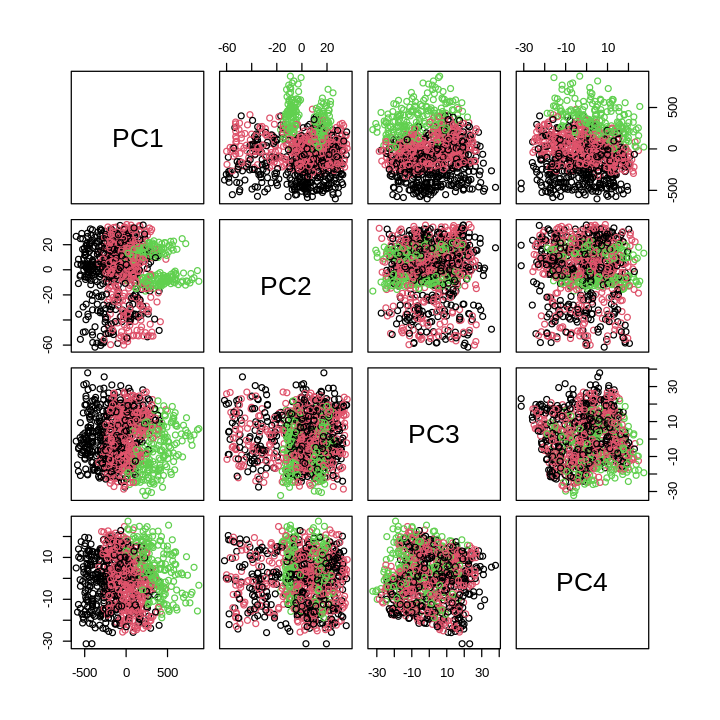

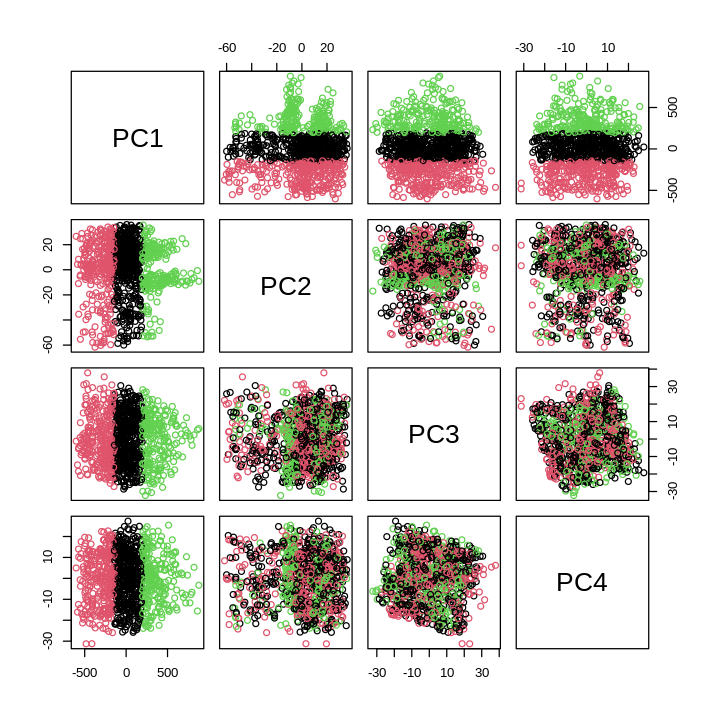

In [197]:
pairs(data_pca$x[, 1:4], col=as.numeric(as.factor(XP)))
pairs(data_pca$x[, 1:4], col=as.numeric(as.factor(kmeans_k3_data_pca$cluster)))

Sorprendentemente en la PCA los datos parecen estar mas mezclados entre las clases, a pesar de que en con las clases originales parece haber mucho ruído los centros fueron bien colocados ya que podemos ver una coindidencia entre las dos gráficas.

## Tipo de entrenamiento

In [198]:
centers = 4
kmeans_k4_data <- kmeans(data, centers=centers, nstart = 20)
kmeans_k4_data_log <- kmeans(data_log, centers=centers, nstart = 20)
kmeans_k4_data_log_scaled <- kmeans(data_log_scaled, centers=centers, nstart = 20)
kmeans_k4_data_log_scaled_pca <- kmeans(data_log_scaled_pca$x, centers=centers, nstart = 20)
kmeans_k4_data_log_scaled_pca_scaled <- kmeans(data_log_scaled_pca_scaled, centers=centers, nstart = 20)
kmeans_k4_data_scaled <- kmeans(data_scaled, centers=centers, nstart = 20)
kmeans_k4_data_scaled_pca <- kmeans(data_scaled_pca$x, centers=centers, nstart = 20)
kmeans_k4_data_scaled_pca_scaled <- kmeans(data_scaled_pca_scaled, centers=centers, nstart = 20)
kmeans_k4_data_pca <- kmeans(data_pca$x, centers=centers, nstart = 20)
kmeans_k4_data_pca_scaled <- kmeans(data_pca_scaled, centers=centers, nstart = 20)

Warning message:
“did not converge in 10 iterations”


In [199]:
cat("------- Datos Base -------\n")
compare_clusters(type, kmeans_k4_data$cluster)
cat("\n\n------- Transformacion Logaritmica -------\n")
compare_clusters(type, kmeans_k4_data_log$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado -------\n")
compare_clusters(type, kmeans_k4_data_log_scaled$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA -------\n")
compare_clusters(type, kmeans_k4_data_log_scaled_pca$cluster)
cat("\n\n------- Transformacion Logaritmica + Escalado + PCA + Escalado -------\n")
compare_clusters(type, kmeans_k4_data_log_scaled_pca_scaled$cluster)
cat("\n\n------- Escalado -------\n")
compare_clusters(type, kmeans_k4_data_scaled$cluster)
cat("\n\n------- Escalado + PCA -------\n")
compare_clusters(type, kmeans_k4_data_scaled_pca$cluster)
cat("\n\n------- Escalado + PCA + Escalado-------\n")
compare_clusters(type, kmeans_k4_data_scaled_pca_scaled$cluster)
cat("\n\n------- PCA -------\n")
compare_clusters(type, kmeans_k4_data_pca$cluster)
cat("\n\n------- PCA + Escalado -------\n")
compare_clusters(type, kmeans_k4_data_pca_scaled$cluster)

------- Datos Base -------
Direct agreement: 0 of 4 pairs
Iterations for permutation matching: 24 
Cases in matched pairs: 27.03 %
          cluster_result
class       3  1  4  2
  Cardio   98 29 77 51
  HIIT     74 29 78 40
  Strength 98 28 87 45
  Yoga     90 34 66 49


------- Transformacion Logaritmica -------
Direct agreement: 0 of 4 pairs
Iterations for permutation matching: 24 
Cases in matched pairs: 28.16 %
          cluster_result
class        3   2   4   1
  Cardio    64  45  98  48
  HIIT      41  49 101  30
  Strength  50  45 123  40
  Yoga      50  54  97  38


------- Transformacion Logaritmica + Escalado -------
Direct agreement: 0 of 4 pairs
Iterations for permutation matching: 24 
Cases in matched pairs: 29.7 %
          cluster_result
class        3   1   4   2
  Cardio    50  45  96  64
  HIIT      31  50  94  46
  Strength  36  45 127  50
  Yoga      34  54  89  62


------- Transformacion Logaritmica + Escalado + PCA -------
Direct agreement: 0 of 4 pairs
Iteratio

Al tratar de agrupar por tipo de entrenamiento podemos ver que el resultado fue muy malo, teniendo un 29.7% de coincidencia como mejor resultado utilizando Transformación logarítmica + escalado.

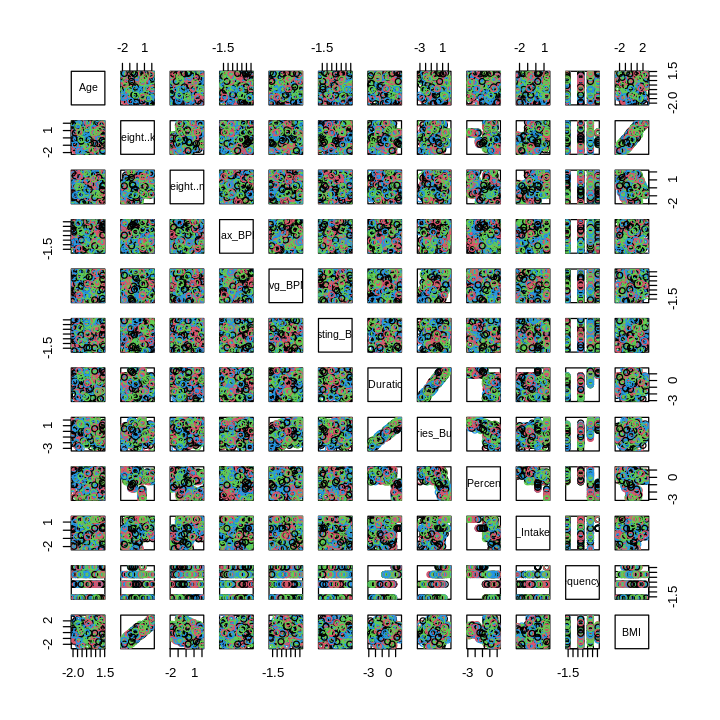

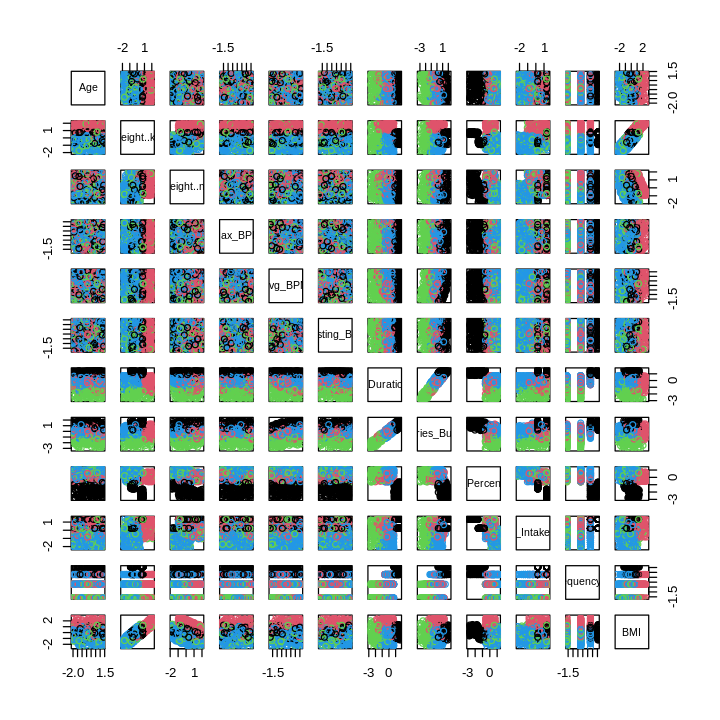

In [200]:
pairs(data_log_scaled, col=as.numeric(as.factor(type)))
pairs(data_log_scaled, col=as.numeric(as.factor(kmeans_k4_data_log_scaled$cluster)))

Claramente la raíz del problema es que no existen agrupaciones por tipo de entrenamiento en los datos, si miramos la priemera gráfica no parece que haya algo más que ruido aleatorio para cualquier par de variables. Al buscar clusters estamos consiguiendo grupos que no tienen niguna correlación con los tipos, ya que no existen estos clusters que buscamos.